<a href="https://colab.research.google.com/github/Gabejevans/ProjectSQL/blob/main/Transfer_Learning_Experimentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# for quicker restarts
epochs = 1

## Transfer Learning

In the last notebook we look at ways to improve our model such as weight decay, bootstrap aggregation, image augmentation and normalisation, fine tuning of hyperparameters and, lastly, transfer learning. The most success was seen following the transfer learning method using the resnet18 architecture.

### Aims of This Notebook

1. look further into transfer learning techniques
2. investigate other bagging and boosting methods
3. impliment a scheduler effectively into our training loop
4. experiment with pre processing techniques such as standarisation


#### Getting the data

For now we will use the same subset of data from the 101 database

In [ ]:
import torch
import pathlib
from torch import nn

In [ ]:
# set up device agnostic code
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Fri Apr 12 12:39:39 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   44C    P8               9W /  70W |      3MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 13.6 gigabytes of available RAM

Not using a high-RAM runtime


In [ ]:
import requests
import zipfile
from pathlib import Path

In [ ]:
#Set up path to data folder
data_path = Path("Data")
image_path = data_path / "pizza_steak_sushi"

#create image path
if image_path.is_dir():
  print(f"{image_path} already exists, skipping creation")
else:
  print(f"{image_path} doesn't exist, creating path")
  image_path.mkdir(parents= True, exist_ok =True )

# download pizza steak sushi
with open(data_path / "pizza_steak_sushi.zip", "wb") as f:
  request = requests.get("https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip")
  print("downloading pizza steak sushi zip")
  f.write(request.content)

#unzip the data
with zipfile.ZipFile(data_path/"pizza_steak_sushi.zip") as zip_ref:
  zip_ref.extractall(image_path)


Data/pizza_steak_sushi doesn't exist, creating path
downloading pizza steak sushi zip


In [ ]:
import numpy as np
import torch
import torch.optim as optim
from torch.optim import lr_scheduler # scheduler can change the learning rate
import random
from PIL import Image
from torch.utils.data import DataLoader
from torchvision import datasets, transforms


#### 1.1 Calculate mean and std of the data

In [ ]:
image_path_list = list(image_path.glob("*/*/*.jpg"))

mean = [0,0,0]
std = [0,0,0]

transform_loop = transforms.Compose([
    transforms.ToTensor()
    ])

for img_n in image_path_list:

  image = Image.open(img_n)

  image_transformed = transform_loop(image)

   # Calculate mean and standard deviation for each channel
  for channel in range(3):  # Assuming you have 3 channels (RGB)
        mean[channel] += image_transformed[channel].mean()
        std[channel] += image_transformed[channel].std()


# Divide by the number of images to get the final mean and standard deviation
num_images = len(image_path_list)
mean = [m / num_images for m in mean]
std = [s / num_images for s in std]

#provides an averaged mean and standard deviation
print("Mean:", mean)
print("Std:", std)


Mean: [tensor(0.5346), tensor(0.4174), tensor(0.3248)]
Std: [tensor(0.2433), tensor(0.2455), tensor(0.2354)]


#### 1.2 Set up the transforms

In [ ]:
#Create mean and std values - taken from YT vid idk why they work or if they work for this data


train_transform_transfer = transforms.Compose([
                                     transforms.RandomResizedCrop(64),
                                     transforms.RandomHorizontalFlip(),
                                     transforms.ToTensor(),
                                     transforms.Normalize(mean,std)
                                     ])

test_transform = transforms.Compose([
                                    transforms.Resize(size= (64,64)),
                                    transforms.ToTensor(),
                                    transforms.Normalize(mean, std)
])

#### 1.3 Transforming and opening the data

In [ ]:
#create directories to open in ImageFolder
train_dir = "Data/pizza_steak_sushi/train"
test_dir = "Data/pizza_steak_sushi/test"

In [ ]:
train_data_transfer = datasets.ImageFolder(transform = train_transform_transfer,
                                  root = train_dir,
                                  target_transform = None)

test_data_transfer = datasets.ImageFolder(transform = test_transform,
                                 root = test_dir)

#### 1.4 Put the data into dataloaders

In [ ]:
import os

#set up dataloader functions
def train_dataloader(data, BATCH_SIZE, NUM_WORKERS = os.cpu_count()):




    train_dataloader = DataLoader(batch_size= BATCH_SIZE,
                                    shuffle = True,
                                    dataset = data,
                                    num_workers= NUM_WORKERS)

    return train_dataloader


def test_dataloader(data, BATCH_SIZE, NUM_WORKERS = os.cpu_count()):




    test_dataloader = DataLoader(batch_size = BATCH_SIZE,
                                  dataset = data,
                                  num_workers = NUM_WORKERS)

    return test_dataloader

In [ ]:
BATCH_SIZE = 32
train_transfer_dataloader = train_dataloader(train_data_transfer, BATCH_SIZE)
test_transfer_dataloader = test_dataloader(test_data_transfer, BATCH_SIZE)

#### 1.5 Set up training and testing steps

In [ ]:
def train_step(model: torch.nn.Module,
               dataloader: torch.utils.data.DataLoader,
               loss_fn: torch.nn.Module,
               optimizer: torch.optim.Optimizer):
    # Put model in train mode
    model.train()

    # Setup train loss and train accuracy values
    train_loss, train_acc = 0, 0

    # Loop through data loader data batches
    for batch, (X, y) in enumerate(dataloader):
        # Send data to target device
        X, y = X.to(device), y.to(device)

        # 1. Forward pass
        y_pred = model(X)

        # 2. Calculate  and accumulate loss
        loss = loss_fn(y_pred, y)
        train_loss += loss.item()

        # 3. Optimizer zero grad
        optimizer.zero_grad()

        # 4. Loss backward
        loss.backward()

        # 5. Optimizer step
        optimizer.step()

        # Calculate and accumulate accuracy metric across all batches
        y_pred_class = torch.argmax(torch.softmax(y_pred, dim=1), dim=1)
        train_acc += (y_pred_class == y).sum().item()/len(y_pred)

    # Adjust metrics to get average loss and accuracy per batch
    train_loss = train_loss / len(dataloader)
    train_acc = train_acc / len(dataloader)
    return train_loss, train_acc

def test_step(model: torch.nn.Module,
              dataloader: torch.utils.data.DataLoader,
              loss_fn: torch.nn.Module):
    # Put model in eval mode
    model.eval()

    # Setup test loss and test accuracy values
    test_loss, test_acc = 0, 0

    # Turn on inference context manager
    with torch.inference_mode():
        # Loop through DataLoader batches
        for batch, (X, y) in enumerate(dataloader):
            # Send data to target device
            X, y = X.to(device), y.to(device)

            # 1. Forward pass
            test_pred_logits = model(X)

            # 2. Calculate and accumulate loss
            loss = loss_fn(test_pred_logits, y)
            test_loss += loss.item()

            # Calculate and accumulate accuracy
            test_pred_labels = test_pred_logits.argmax(dim=1)
            test_acc += ((test_pred_labels == y).sum().item()/len(test_pred_labels))

    # Adjust metrics to get average loss and accuracy per batch
    test_loss = test_loss / len(dataloader)
    test_acc = test_acc / len(dataloader)
    return test_loss, test_acc

#### 1.6 Create the first model as seen on YT

In [ ]:
from torchvision import models

#import the resnet18 model
model_transfer_0 = models.resnet18(weights = 'DEFAULT')

#check for the number of out features on the resnet18 model
number_features = model_transfer_0.fc.in_features
number_features

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:01<00:00, 25.2MB/s]


512

In [ ]:
# set requires grad to false, this will stop the model from training
for param in model_transfer_0.parameters():
   param.requires_grad = False

In [ ]:
#create a new layer
model_transfer_0.fc = nn.Linear(in_features = number_features, out_features = 3 )
model_transfer_0.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
optimizer_transfer_0 = optim.SGD(model_transfer_0.parameters(), lr = 0.001)

### THE ERROR IS HERE
the optimizer we used in the example that worked for the scheduler isn't the same optimizer.

#### 1.7 Set-up the scheduler

In [ ]:
#Every 10 epochs our learning rate is reduced to 50% of the original learning rate
step_lr_scheduler = lr_scheduler.StepLR(optimizer_transfer_0, step_size = 10, gamma = 0.5)


1.8 Define the training loop

In [ ]:
from tqdm.auto import tqdm

# 1. Take in various parameters required for training and test steps
def train_0(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          scheduler: lr_scheduler.StepLR = None,
          loss_fn: torch.nn.Module = nn.CrossEntropyLoss(),
          epochs: int = 5):

    # 2. Create empty results dictionary
    results = {"train_loss": [],
        "train_acc": [],
        "test_loss": [],
        "test_acc": []
    }

    # 3. Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc = train_step(model=model,
                                           dataloader = train_dataloader,
                                           loss_fn= nn.CrossEntropyLoss(),
                                           optimizer=optimizer)
        test_loss, test_acc = test_step(model=model,
                                        dataloader = test_dataloader,
                                        loss_fn= nn.CrossEntropyLoss())
        #add in the scheduler
        if scheduler:
          scheduler.step()

        # 4. Print out what's happening
        print(
            f"Epoch: {epoch+1} | "
            f"train_loss: {train_loss:.4f} | "
            f"train_acc: {train_acc:.4f} | "
            f"test_loss: {test_loss:.4f} | "
            f"test_acc: {test_acc:.4f}"
        )

        # 5. Update results dictionary
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)

    # 6. Return the filled results at the end of the epochs
    return results

In [ ]:
results_transfer_0 = train_0(model = model_transfer_0,
        train_dataloader = train_transfer_dataloader,
        test_dataloader = test_transfer_dataloader,
        optimizer = optimizer_transfer_0,
        scheduler= step_lr_scheduler,
        epochs = 1  # model is confirmed as functioning the same as the class
        )

  0%|          | 0/1 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Epoch: 1 | train_loss: 1.3601 | train_acc: 0.2812 | test_loss: 1.1802 | test_acc: 0.4725


### WHAT IS ACTUALLY HAPPENING HERE?
### WHY IS IT WORKING...

- maybe the scheduler itself isn't taking affect due to it tracking model_4, we do only ge the error about the scheduler usng this code. the model does consistently take big jumps suggesting now changes in the learning rate
- I doubt model 4 is contributiong to the increased accuracy

### What was happening...
The scheduler was not working for the original run as it was set up on the wrong optimizer for the loop. When the scheduler was working for the other code it was decreasing the learning rate too quickly which was leading to no progress being made.

See notebook 05 for code

In [ ]:
import matplotlib.pyplot as plt

#copy across our plotting functions
#maybe we could save these and call them from another notebook to save space
def plot_loss_acc(results):


    loss = results["train_loss"]
    test_loss = results["test_loss"]

    accuracy = results["train_acc"]
    test_accuracy = results["test_acc"]

    epochs = range(len(results["train_loss"]))

    plt.figure(figsize = (15,7))

    plt.subplot(1,2,1)
    plt.plot(epochs,loss, c = 'g', label = "train loss")
    plt.plot(epochs,test_loss, c = 'r', label = "test loss")
    plt.xlabel('Epochs')
    plt.title('Loss')
    plt.grid(True)
    plt.legend()

    plt.subplot(1,2,2)
    plt.plot(epochs, accuracy, c = 'g', label = "train accuracy")
    plt.plot(epochs, test_accuracy, c = 'r', label = "test accuracy")
    plt.xlabel('Epochs')
    plt.title('Accuracy')
    plt.grid(True)
    plt.legend()

    plt.show()

def compare_loss_acc(*results):

    plt.figure(figsize=(10, 10))



    for i, result in enumerate(results):

        train_loss = result["train_loss"]
        train_acc = result["train_acc"]
        test_loss = result["test_loss"]
        test_acc = result["test_acc"]
        epochs = range(len(test_loss))

        plt.subplot(2,2,1)
        plt.plot(epochs, train_loss, label=f"trial {i+1}")
        plt.xlabel('Epochs')
        plt.ylabel("Loss")
        plt.title("Train Loss")
        plt.legend()

        plt.subplot(2,2,2)
        plt.plot(epochs, train_acc, label=f" trial {i+1}")
        plt.xlabel('Epochs')
        plt.ylabel("Accuracy")
        plt.title("Train Accuracy")
        plt.legend()



        plt.subplot(2,2,3)
        plt.plot(epochs, test_loss, label=f" trial {i+1}")
        plt.xlabel('Epochs')
        plt.ylabel("Loss")
        plt.title("Test Loss")
        plt.legend()

        plt.subplot(2,2,4)
        plt.plot(epochs, test_acc, label=f" trial {i+1}")
        plt.xlabel('Epochs')
        plt.ylabel("Accuracy")
        plt.title("Test Accuracy")
        plt.legend()




    plt.show()






In [ ]:
plot_loss_acc(results_transfer_0)

### Results
The results of the original model tend towards around 70% accuracy

### Moving Forward

The scheduler is working and the model is now training reasonably well.

Next steps:

- Bring back the class for the model and check that it works the same.
- Try with different layers as the last layer i.e convolutional layers.
- Use a different transfer learning architecture i.e resnet50.
- Try training the first layer first and then train witht he rest of the data.

###### The code above was copied from the last notebook before it got deleted. from here on there will be reset in formatting ######

#### 2. Changing the model to a class

#### 2.1 Creating a class for our model

In [ ]:
import torch.nn as nn
from torchvision import models

class MyResNetModel(nn.Module):
    def __init__(self, model_type='resnet18', num_classes=3):
        super(MyResNetModel, self).__init__()

        # Check if the selected model type is supported
        assert model_type in ['resnet18', 'resnet50'], "Unsupported model type. Choose between 'resnet18' and 'resnet50'."

        # Import the specified ResNet model
        if model_type == 'resnet18':
            self.model_transfer = models.resnet18(pretrained=True)
        else:
            self.model_transfer = models.resnet50(pretrained=True)

        # Check for the number of out features on the chosen ResNet model
        number_features = self.model_transfer.fc.in_features

        # Set requires_grad to false, this will stop the model from training
        for param in self.model_transfer.parameters():
            param.requires_grad = False

        # Create a new layer
        self.model_transfer.fc = nn.Linear(in_features=number_features, out_features=num_classes)

    def forward(self, x):
        return self.model_transfer(x)

#Creaye an instance of the models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_resnet18 = MyResNetModel(model_type='resnet18', num_classes=3)
model_resnet18.to(device)

model_resnet50 = MyResNetModel(model_type='resnet50', num_classes=3)
model_resnet50.to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weig

MyResNetModel(
  (model_transfer): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequentia

#### 2.2 Create an instance of the models

In [ ]:
#resnet18
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_resnet18 = MyResNetModel(model_type='resnet18', num_classes=3)
model_resnet18.to(device)

#resnet50
model_resnet50 = MyResNetModel(model_type='resnet50', num_classes=3)
model_resnet50.to(device)

MyResNetModel(
  (model_transfer): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequentia

#### 2.3 Set up the optimizers



In [ ]:
optimizer_resnet18 = torch.optim.SGD(model_resnet18.parameters(), lr = 0.001)
optimizer_resnet50 = torch.optim.SGD(model_resnet50.parameters(), lr = 0.001)


#### 2.4 Set up the schedulers

In [ ]:
scheduler_resnet18 = lr_scheduler.StepLR(optimizer_resnet18, step_size = 40, gamma = 0.5)
scheduler_resnet50 = lr_scheduler.StepLR(optimizer_resnet50, step_size = 40, gamma = 0.5)

#### 2.5 Train the models

In [ ]:
results_resnet18 = train_0(model = model_resnet18,
        train_dataloader = train_transfer_dataloader,
        test_dataloader = test_transfer_dataloader,
        optimizer = optimizer_resnet18,
        scheduler= scheduler_resnet18,
        epochs = epochs
        )
results_resnet50 = train_0(model = model_resnet50,
        train_dataloader = train_transfer_dataloader,
        test_dataloader = test_transfer_dataloader,
        optimizer = optimizer_resnet50,
        scheduler= scheduler_resnet50,
        epochs = epochs
        )

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.2103 | train_acc: 0.3555 | test_loss: 1.6695 | test_acc: 0.2169


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.1536 | train_acc: 0.2500 | test_loss: 1.3500 | test_acc: 0.2604


#### 2.6 Visualise the models

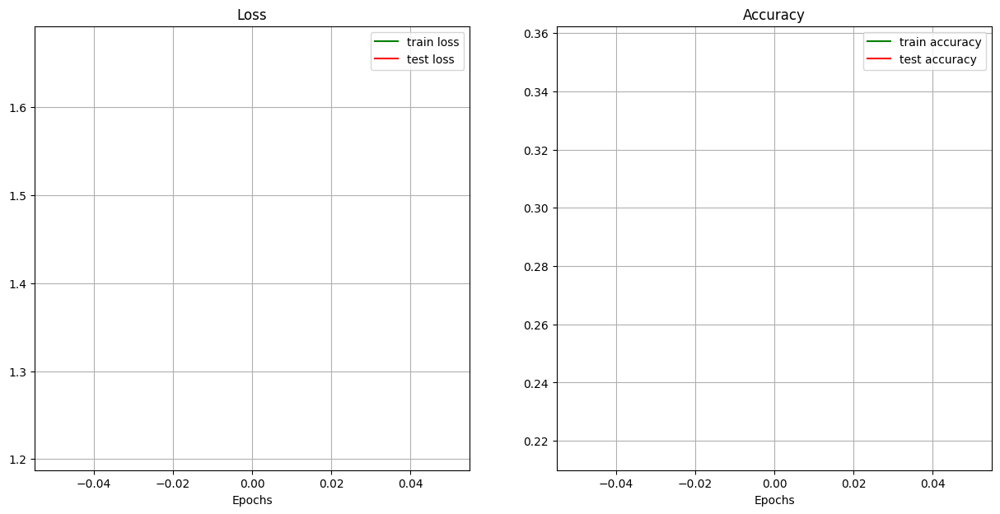

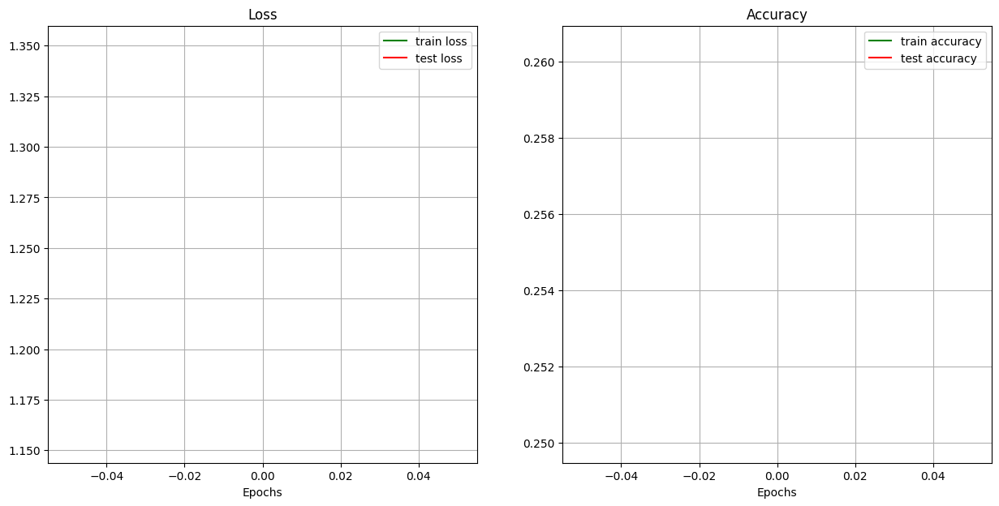

In [ ]:
plot_loss_acc(results_resnet18)
plot_loss_acc(results_resnet50)

#### 2.7 Compare the Models

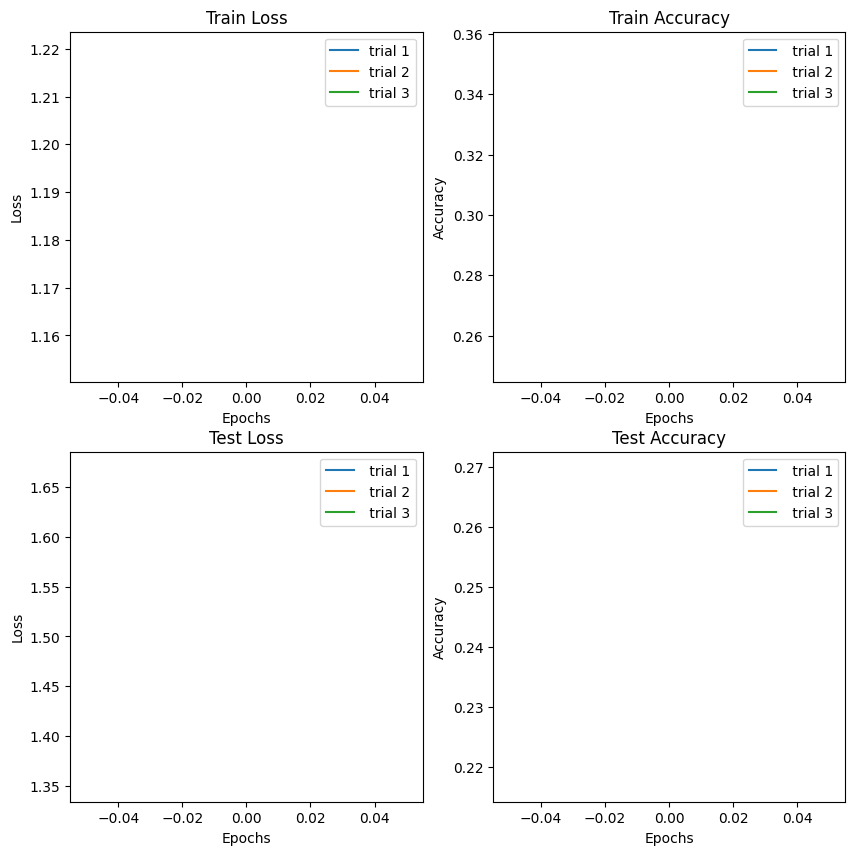

In [ ]:
compare_loss_acc(results_transfer_0, results_resnet18, results_resnet50)

#### 2.8 Analysis

=Trials 1 and 2 use resnet18 whereas trial 3 uses resnet 50
- Similar results seen using renet18 and resnet50 howvere resnet 50 does ahve better performance overall
- the class we defined is definitely working the same as the code from YT so we can move forward with that


### Moving Forward

Next lets look into changing the last layer to maybe a convolutional layer and see how that effects the results

#### 3. Adding a convolutional layer

we could just add one convolutional layer, or we could look to add on our entire TinyVGG arcitecture that we used before.

First lets just add one convolutional layer


##### 3.1 The Model

In [ ]:
class ResNetModelConv(nn.Module):
    def __init__(self, num_classes, hidden_units,  model_type = 'resnet18'):
        super(ResNetModelConv, self).__init__()

        # Check if the selected model type is supported
        assert model_type in ['resnet18', 'resnet50'], "Unsupported model type. Choose between 'resnet18' and 'resnet50'."

        # Import the specified ResNet model
        if model_type == 'resnet18':
            self.model_transfer = models.resnet18()
        else:
            self.model_transfer = models.resnet50()

        # Check for the number of out features on the chosen ResNet model
        number_features = self.model_transfer.fc.out_features

        # Set requires_grad to false, this will stop the model from training
        for param in self.model_transfer.parameters():
            param.requires_grad = False

        # Create a new convolutional layer

        self.conv_layer = nn.Sequential(
            nn.Conv2d(in_channels=number_features,
                      out_channels=number_features,
                      kernel_size = 1,
                      stride = 1,
                      padding = 0),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size = 2,
                         stride = 2)
        )

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(in_features = hidden_units, # changes depending on the model
                      out_features= num_classes))

    def forward(self, x):

        x = self.model_transfer(x)
        print(x.shape)

        x = x.unsqueeze(2).unsqueeze(3) # ensure correct dimensions
        print(x.shape)
        x = self.conv_layer(x)
        print(x.shape)
        # flattena nd apply the classifier
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        print(x.shape)

        return self.model_transfer(x)

In [ ]:
model_transfer_conv = ResNetModelConv( num_classes = 3,
                              hidden_units = 10,
                              model_type = 'resnet50').to(device)

In [ ]:
optimizer_transfer_conv = optim.SGD(model_transfer_conv.parameters(), lr = 0.001)
scheduler_transfer_conv = lr_scheduler.StepLR(optimizer_transfer_conv, step_size = 40, gamma = 0.5)

#### The method above will not be successful due to the nature of resnets outputs and the convolutional layer

Adding a convolutional layer might still be successul in picking up on features that resnet misses out on. so wecan try a model which removes the fully connected laer from the pretrained model and adds a custom convolutional layer.

#### 3.2 Model from chat gpt

In [ ]:
import torch.nn as nn
from torchvision import models

class TransferLearningModel(nn.Module):
    def __init__(self, num_classes, hidden_units=10):
        super(TransferLearningModel, self).__init__()

        # Load pre-trained ResNet-50
        self.resnet50 = models.resnet50(pretrained=True)

        # Remove the original fully connected layer
        self.resnet50 = nn.Sequential(*list(self.resnet50.children())[:-1])

        # Extract the number of output channels from the last layer
        last_layer = list(self.resnet50.children())[-1]
        if isinstance(last_layer, nn.AdaptiveAvgPool2d):
            num_channels = last_layer.output_size[0]  # Corrected line
        elif isinstance(last_layer, nn.Conv2d):
            num_channels = last_layer.out_channels
        else:
            raise ValueError("Unsupported last layer type")

        # Add custom convolutional layers
        self.conv_layers = nn.Sequential(
            nn.Conv2d(in_channels=num_channels,
                      out_channels=hidden_units,
                      kernel_size=3,
                      stride=1,
                      padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        # Add a new fully connected layer for the new task
        self.classifier = nn.Linear(hidden_units, num_classes)

    def forward(self, x):

        x = self.resnet50(x)
        print(x.shape)
        x = self.conv_layers(x)
        print(x.shape)
        x = x.view(x.size(0), -1)  # Flatten the tensor
        print(x.shape)
        x = self.classifier(x)
        return x

# Usage
num_classes = 3  # Replace with the number of classes in your specific task
hidden_units = 64  # You can adjust the number of hidden units
model_transfer_conv = TransferLearningModel(num_classes=num_classes, hidden_units=hidden_units).to(device)

In [ ]:
optimizer_transfer_conv = optim.SGD(model_transfer_conv.parameters(), lr = 0.001)
scheduler_transfer_conv = lr_scheduler.StepLR(optimizer_transfer_conv, step_size = 40, gamma = 0.5)

### 4. I think we are heading in the wrong direction.
#### What does ResNet50 expect as an input?

Pytorch Resnet information:

- All pre-trained models expect input images normalized in the same way, i.e. mini-batches of
3-channel RGB images of shape (3 x H x W), where H and W are expected to be at least 224.

- The images have to be loaded in to a range of [0, 1] and then normalized using mean =
[0.485, 0.456, 0.406] and std = [0.229, 0.224, 0.225].

Lets try again using this information for our image processing


#### 4.1 Image Transforms

In [ ]:
mean = [0.485,0.456,0.406]
std = [0.229,0.224,0.225]

In [ ]:
train_transform_transfer_1 = transforms.Compose([
                                     transforms.RandomResizedCrop(224),
                                     transforms.RandomHorizontalFlip(),
                                     transforms.ToTensor(),
                                     transforms.Normalize(mean,std)
                                     ])

test_transform_transfer_1 = transforms.Compose([
                                    transforms.Resize(size= (224,224)),
                                    transforms.ToTensor(),
                                    transforms.Normalize(mean, std)
])

In [ ]:
train_data_transfer_1 = datasets.ImageFolder(transform = train_transform_transfer_1,
                                  root = train_dir,
                                  target_transform = None)

test_data_transfer_1 = datasets.ImageFolder(transform = test_transform_transfer_1,
                                 root = test_dir)

#### 4.2 Turn Data into DataLoaders

In [ ]:
BATCH_SIZE = 32
train_transfer_dataloader_1 = train_dataloader(train_data_transfer_1, BATCH_SIZE)
test_transfer_dataloader_1 = test_dataloader(test_data_transfer_1, BATCH_SIZE)

#### 4.3 Create an instance of our Model

In [ ]:
model_transfer_1 = MyResNetModel( model_type = 'resnet50',
                                 num_classes = 3).to(device)

#### 4.4 Set up the optimizers and the scheduler

In [ ]:
optimizer_transfer_1 = optim.SGD(model_transfer_1.parameters(), lr = 0.001)
scheduler_transfer_1 = lr_scheduler.StepLR(optimizer_transfer_1, step_size = 40, gamma = 0.5)

#### 4.5 Train the Model

In [ ]:
results_transfer_1 = train_0(model = model_transfer_1,
        train_dataloader = train_transfer_dataloader_1,
        test_dataloader = test_transfer_dataloader_1,
        optimizer = optimizer_transfer_1,
        scheduler= scheduler_transfer_1,
        epochs = epochs
        )

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.1595 | train_acc: 0.2812 | test_loss: 1.2274 | test_acc: 0.2812


#### 4.6 Compare with previous results

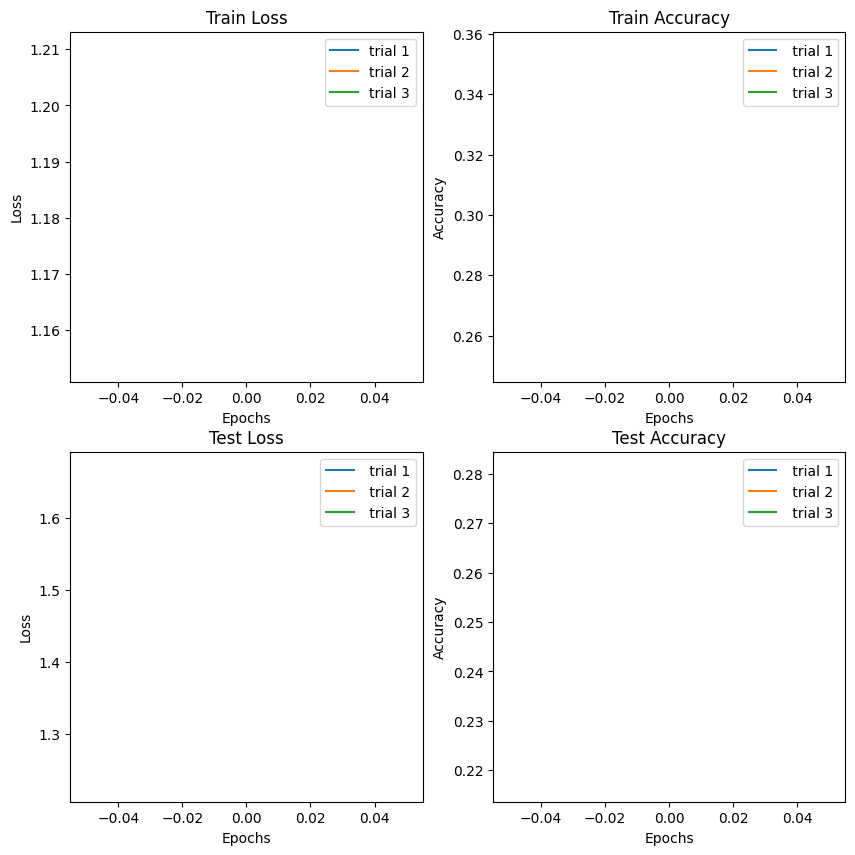

In [ ]:
compare_loss_acc(results_resnet18, results_resnet50, results_transfer_1)


#### Evaluation
The model using the proper inputs for ResNet50 performed a lot better than the other models. Moral is to read the required inputs.

#### 4.7 Plotting a confusion matrix
Here we can see the cases where our model is struggling to predict correctly

In [ ]:
# 1. Make predictions with trained model
y_preds = []
model_transfer_1.eval()
with torch.inference_mode():
  for X, y in tqdm(test_transfer_dataloader_1, desc="Making predictions"):
    # Send data and targets to target device
    X, y = X.to(device), y.to(device)
    # Do the forward pass
    y_logit = model_transfer_1(X)
    # Turn predictions from logits -> prediction probabilities -> predictions labels
    y_pred = torch.softmax(y_logit, dim=1).argmax(dim=1) # note: perform softmax on the "logits" dimension, not "batch" dimension (in this case we have a batch size of 32, so can perform on dim=1)
    # Put predictions on CPU for evaluation
    y_preds.append(y_pred.cpu())
# Concatenate list of predictions into a tensor
y_pred_tensor = torch.cat(y_preds)
y_pred_tensor

Making predictions:   0%|          | 0/3 [00:00<?, ?it/s]

tensor([0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 2, 0, 0, 0, 0, 0, 1, 0, 0, 0,
        0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 1])

In [ ]:
# See if torchmetrics exists, if not, install it
try:
    import torchmetrics, mlxtend
    print(f"mlxtend version: {mlxtend.__version__}")
    assert int(mlxtend.__version__.split(".")[1]) >= 19, "mlxtend verison should be 0.19.0 or higher"
except:
    !pip install -q torchmetrics -U mlxtend # <- Note: If you're using Google Colab, this may require restarting the runtime
    import torchmetrics, mlxtend
    print(f"mlxtend version: {mlxtend.__version__}")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 805.2/805.2 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 16.8 MB/s eta 0:00:00
mlxtend version: 0.23.0


In [ ]:
# Import mlxtend upgraded version
import mlxtend
print(mlxtend.__version__)
assert int(mlxtend.__version__.split(".")[1]) >= 19 # should be version 0.19.0 or higher


0.23.0


In [ ]:
#get class names
class_names = train_data_transfer.classes
class_names

['pizza', 'steak', 'sushi']

In [ ]:
test_data_conf = torch.tensor(test_data_transfer_1.targets)

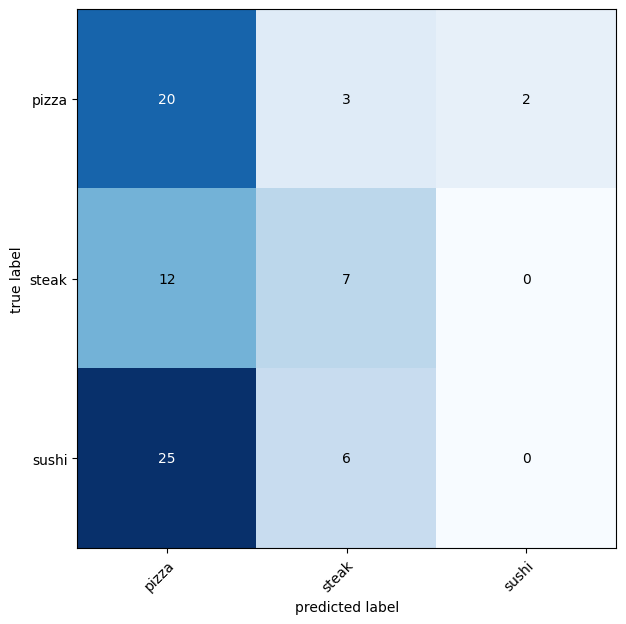

In [ ]:
from torchmetrics import ConfusionMatrix
from mlxtend.plotting import plot_confusion_matrix

# 2. Setup confusion matrix instance and compare predictions to targets
confmat = ConfusionMatrix(num_classes= 3, task='multiclass')
confmat_tensor = confmat(preds=y_pred_tensor,
                         target= test_data_conf)

# 3. Plot the confusion matrix
fig, ax = plot_confusion_matrix(
    conf_mat=confmat_tensor.numpy(), # matplotlib likes working with NumPy
    class_names=class_names, # turn the row and column labels into class names
    figsize=(10, 7)
);

#### 4.8 Further evaluation

Sushi has the most issues during predictions which makes sense due to the nature of sushi. overall the model is functioning very well on a limited dataset.

Lets have a look at our most wrong predictions and see what might be going on witht the data, we can do this by:

- predicting across all of the test dataset.
- sort the predictions by wrong prediction and then descending prediction probability
- plot the 5 most wrong images



In [ ]:
model_transfer_1 = model_transfer_1.cpu()
# Create a DataFrame with sample, label, prediction, pred prob

# Get all test data paths
from pathlib import Path
test_data_paths = list(Path(test_dir).glob('*/*.jpg'))
test_labels = [path.parent.stem for path in test_data_paths]

# Create a function to return a list of dictionaries
def pred_and_store(test_paths, model, transform, class_names):
  test_pred_list = []
  for path in test_paths:
     pred_dict = {}

     #get sample path
     pred_dict["image_path"] = path

     #get class name
     class_name = path.parent.stem
     pred_dict["class_name"] = class_name

     #get prediction
     from PIL import Image
     img = Image.open(path)
     transformed_image = transform(img).unsqueeze(0) # transform image and add batch dimension
     model.eval()
     with torch.inference_mode():
      pred_logit = model(transformed_image)
      pred_prob = torch.softmax(pred_logit, dim = 1)
      pred_label = torch.argmax(pred_prob, dim = 1)
      pred_class = class_names[pred_label]

      pred_dict["pred_prob"] = pred_prob.unsqueeze(0).max()
      pred_dict["pred_class"] = pred_class


     # does the pred label match the true label
     pred_dict["correct"] = class_name == pred_class

     # Add the dictionary to the list of preds
     test_pred_list.append(pred_dict)

  return test_pred_list

transform = transforms.Compose([transforms.ToTensor()])

test_pred_list = pred_and_store(test_paths = test_data_paths,
               model = model_transfer_1,
               transform = transform,
               class_names = class_names)

NameError: ignored

In [ ]:
# turn test pred dict into a dataframe
import pandas as pd
test_pred_df = pd.DataFrame(test_pred_list)
#sort the dataframe
top_5_most_wrong = test_pred_df.sort_values(by = ["correct", "pred_prob"], ascending = [ True, False]).head()

In [ ]:
#Plot the top 5 most wrong images
most_wrong_image_paths = top_5_most_wrong.image_path.tolist()
most_wrong_image_paths

[PosixPath('Data/pizza_steak_sushi/test/sushi/499605.jpg'),
 PosixPath('Data/pizza_steak_sushi/test/sushi/1987407.jpg'),
 PosixPath('Data/pizza_steak_sushi/test/steak/354513.jpg'),
 PosixPath('Data/pizza_steak_sushi/test/sushi/1742201.jpg'),
 PosixPath('Data/pizza_steak_sushi/test/steak/296375.jpg')]

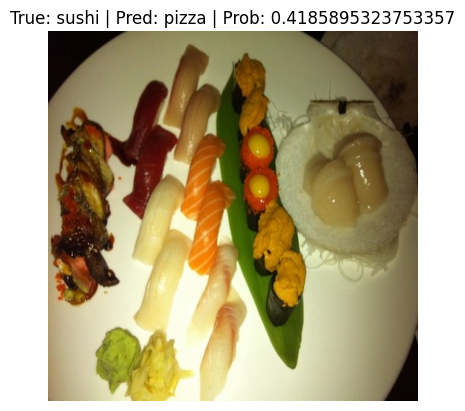

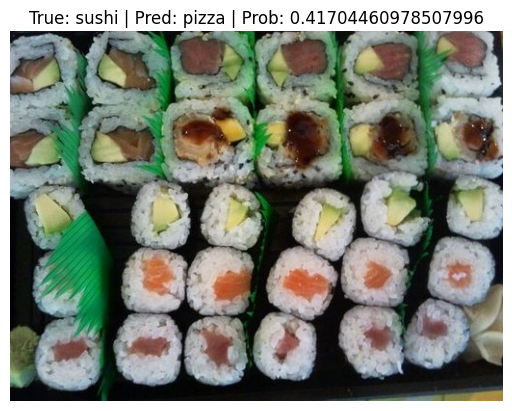

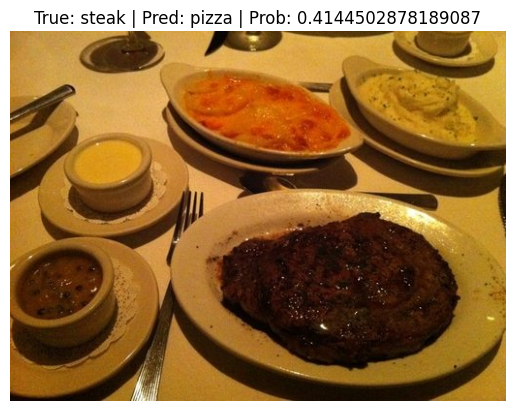

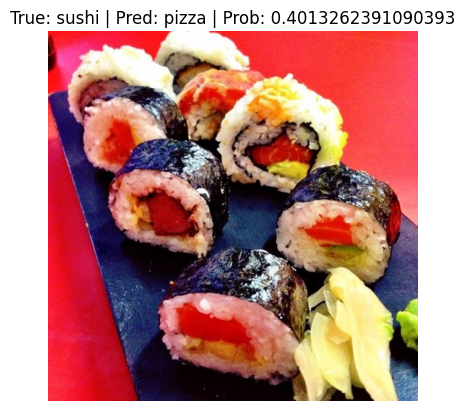

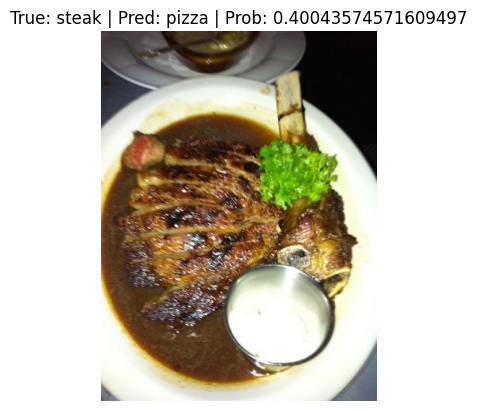

In [ ]:
import torchvision
for row in top_5_most_wrong.iterrows():
  row = row[1]


  image_path = row[0]
  true_label = row[1]
  pred_prob = row[2]
  pred_class = row[3]

  #plot the images
  img = torchvision.io.read_image(str(image_path))
  plt.figure()
  plt.imshow(img.permute(1,2,0))
  plt.title(f"True: {true_label} | Pred: {pred_class} | Prob: {pred_prob}")
  plt.axis(False)

#### Wrong predictions
The most wrong predictions are all on pizza, this is understandable as pizza can have a variety of different tems on it leading to it being msitaken as different food stuffs.

#### Next steps
The model we have is training with up to 90% accuracy on the test dataset. this is very good considering using a CNN we were only reaching around 50%. If we bag this model i'm sure we can achieve even better results. Also we lost the bagging code from before so would be good to have that back lol.

but first the pytoch guy uses efficientnet_b0 which seems to give off much better results quicker than our model

#### 5.1 Model from pytorch video YT
https://www.youtube.com/watch?v=ueLolShyFqs

In [ ]:
#install the model
!pip install efficientnet-pytorch
!pip install --upgrade efficientnet-pytorch

  Preparing metadata (setup.py) ... done
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16428 sha256=8db1a9eae0c6cfefe4904ca96b50de16b5a3c0f6cf4f35ae8963af0b62cb1bb2
  Stored in directory: /root/.cache/pip/wheels/03/3f/e9/911b1bc46869644912bda90a56bcf7b960f20b5187feea3baf
Successfully built efficientnet-pytorch


In [ ]:
from efficientnet_pytorch import EfficientNet

In [ ]:
# create the model following the youtube video
import torchvision
import torch
from torchvision import models
from torch import nn

model_transfer_b0 =  EfficientNet.from_pretrained('efficientnet-b0')#.to(device)

for param in model_transfer_b0.parameters():
    param.requires_grad = True

model_transfer_b0.classifier = torch.nn.Sequential(
    nn.Dropout(p = 0.2,
               inplace = True), # what is this
    nn.Linear(in_features = 1280,
              out_features = len(class_names),
              bias = True ).to(device)
  )

# Set requires_grad to True for the parameters in the classifier
for param in model_transfer_b0.classifier.parameters():
    param.requires_grad = True

model_transfer_b0 = model_transfer_b0.to(device)



Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b0-355c32eb.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b0-355c32eb.pth
100%|██████████| 20.4M/20.4M [00:00<00:00, 201MB/s]

Loaded pretrained weights for efficientnet-b0


In [ ]:
# # Do a summary *after* freezing the features and changing the output classifier layer (uncomment for actual output)
from torchvision import models
from torchsummary import summary
summary(model_transfer_b0,
        input_size=( 3, 224, 224) # make sure this is "input_size", not "input_shape" (batch_size, color_channels, height, width)
)


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
         ZeroPad2d-1          [-1, 3, 225, 225]               0
Conv2dStaticSamePadding-2         [-1, 32, 112, 112]             864
       BatchNorm2d-3         [-1, 32, 112, 112]              64
MemoryEfficientSwish-4         [-1, 32, 112, 112]               0
         ZeroPad2d-5         [-1, 32, 114, 114]               0
Conv2dStaticSamePadding-6         [-1, 32, 112, 112]             288
       BatchNorm2d-7         [-1, 32, 112, 112]              64
MemoryEfficientSwish-8         [-1, 32, 112, 112]               0
          Identity-9             [-1, 32, 1, 1]               0
Conv2dStaticSamePadding-10              [-1, 8, 1, 1]             264
MemoryEfficientSwish-11              [-1, 8, 1, 1]               0
         Identity-12              [-1, 8, 1, 1]               0
Conv2dStaticSamePadding-13             [-1, 32, 1, 1]             288
         I

this model is very different from the video's model. maybe we can just follow their code and see if that works.

#### 5.2 the Data
The minimum and maximum image size used to train the model depends on the model size, table 6 shows the parameters used in the progressive training approach. The minimum size for all models (S, M, and L) is 128 pixels, with the maximum size being 300 pixels for the S model and 380 pixels for the M and L models.

B0 expects 224:
https://keras.io/examples/vision/image_classification_efficientnet_fine_tuning/

This model takes input images of shape (224, 224, 3), and the input data should range [0, 255]. Normalization is included as part of the model. try with and without normalization






#### Set up the optimizers

In [ ]:
# in the video the Adam optimizer is used
optimizer_transfer_2 = torch.optim.Adam(model_transfer_b0.parameters(), lr = 0.001)


Train the model

In [ ]:
results_transfer_2 = train_0(model = model_transfer_b0,
        train_dataloader = train_transfer_dataloader_1,
        test_dataloader = test_transfer_dataloader_1,
        optimizer = optimizer_transfer_2,
        epochs = epochs
        )

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 4.9112 | train_acc: 0.2578 | test_loss: 1.2184 | test_acc: 0.7206


#### 5.6 Initial reaction
Chat GPT pointed out the error i was getting while trying to train was due to me setting requires grad = False for my efficientnet_b0layers so I switched it to True.

For some reason this has worked really well with the full models requires grad = True, so the layers aren't frozen?

maybe the fact that i loaded a pretrained model in a different way to the youtube video means that i didn't have to set requires grad to false for the model, maybe it's already doen that?

Either way the results are very good and inline with the youtube videos results.

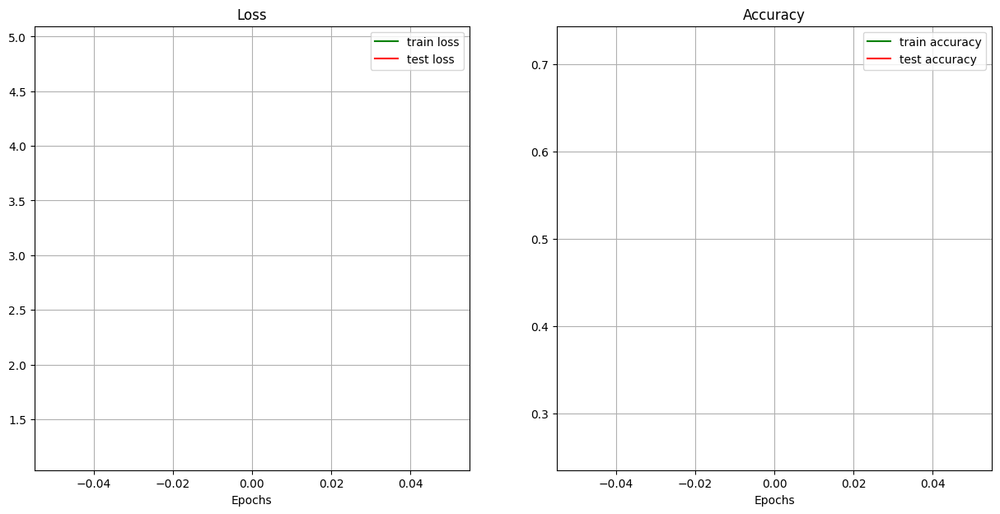

In [ ]:
plot_loss_acc(results_transfer_2)

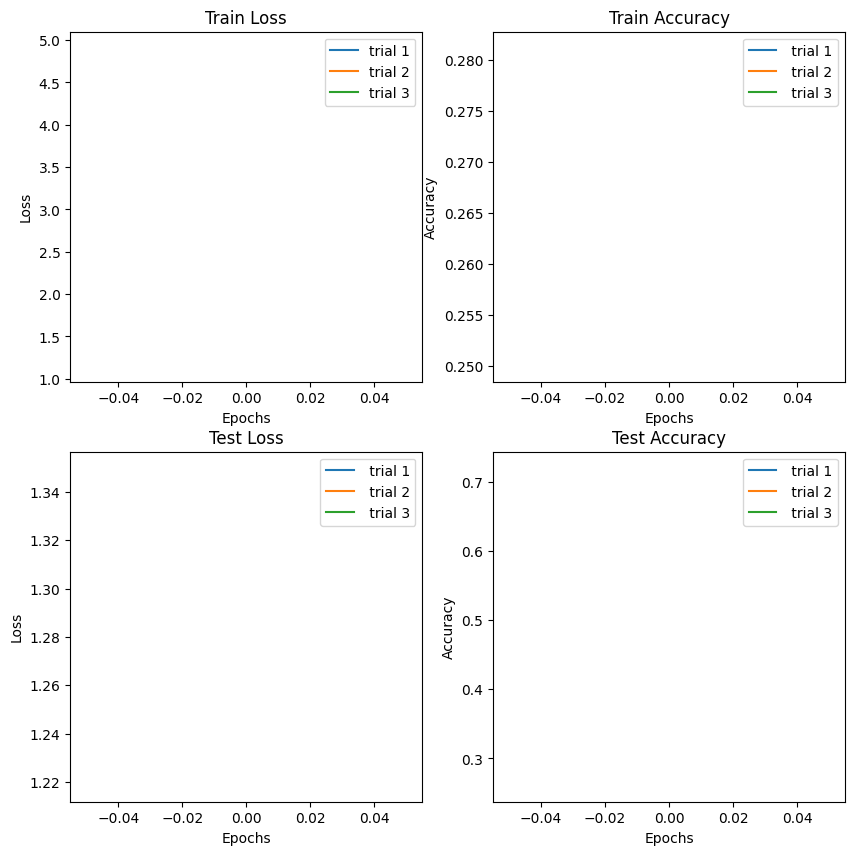

In [ ]:
compare_loss_acc( results_resnet50, results_transfer_1, results_transfer_2)

EffientNet is very efficient...

it seems like after 10 epochs we may even have a case of overfitting beggining

lets run it for longer and see if the downward trend seen after the 4th epoch continues

In [ ]:
results_transfer_2['new_results'] = (train_0(model = model_transfer_b0,
        train_dataloader = train_transfer_dataloader_1,
        test_dataloader = test_transfer_dataloader_1,
        optimizer = optimizer_transfer_2,
        epochs = epochs
        ))

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0928 | train_acc: 0.7539 | test_loss: 1.0491 | test_acc: 0.8153


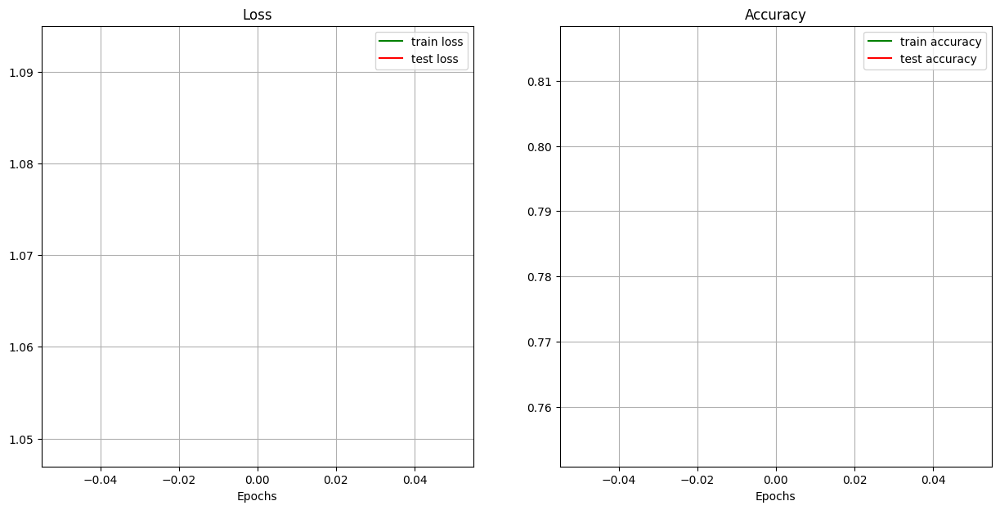

In [ ]:
plot_loss_acc(results_transfer_2['new_results'])

#### Results of longer training

I think its fair to say that our results peaked at epoch 5 apart from the odd high spike. and that test loss actually begins to grow after this point.  

Would this be a good time to implement early stopping?

potentially implementing data augmentation or a learning rate decay (scheduler) can help to prevent overfitting.

My guy also has a larger dataset we can use lets try with that as well.  




6. Add in the scheduler

In [ ]:
# create the model following the youtube video
import torchvision
import torch
from torchvision import models
from torch import nn

model_transfer_b0_1 =  EfficientNet.from_pretrained('efficientnet-b0')#.to(device)

for param in model_transfer_b0_1.parameters():
    param.requires_grad = True

model_transfer_b0_1.classifier = torch.nn.Sequential(
    nn.Dropout(p = 0.2,
               inplace = True), # what is this
    nn.Linear(in_features = 1280,
              out_features = len(class_names),
              bias = True ).to(device)
  )

# Set requires_grad to True for the parameters in the classifier
for param in model_transfer_b0_1.classifier.parameters():
    param.requires_grad = True

model_transfer_b0_1 = model_transfer_b0_1.to(device)

Loaded pretrained weights for efficientnet-b0


In [ ]:
optimizer_transfer_3 = torch.optim.Adam(model_transfer_b0_1.parameters(), lr = 0.001)
scheduler_transfer_3 = lr_scheduler.StepLR(optimizer_transfer_3, step_size = 5, gamma = 0.1)

In [ ]:
results_transfer_3 = train_0(model = model_transfer_b0_1,
        train_dataloader = train_transfer_dataloader_1,
        test_dataloader = test_transfer_dataloader_1,
        optimizer = optimizer_transfer_3,
        scheduler = scheduler_transfer_3,
        epochs = epochs
        )

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 5.0136 | train_acc: 0.2383 | test_loss: 0.5782 | test_acc: 0.8551


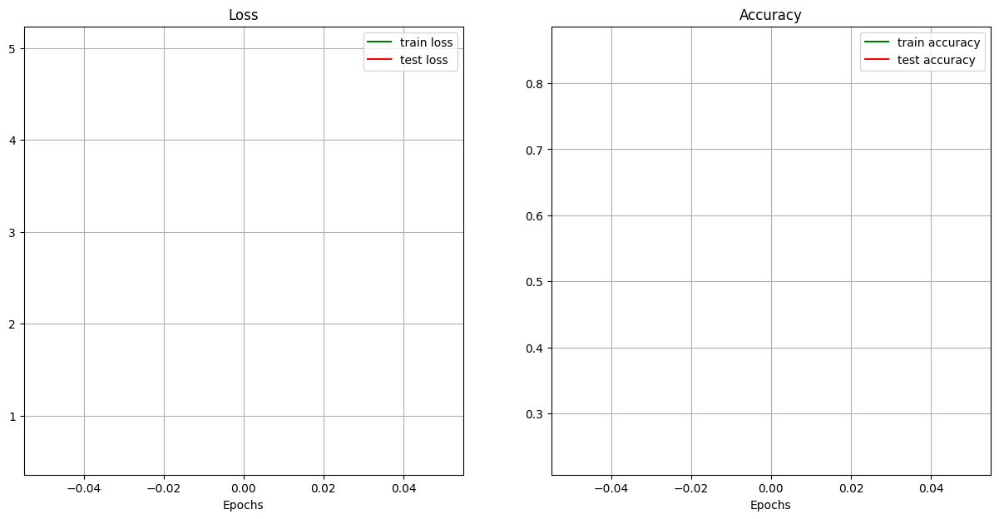

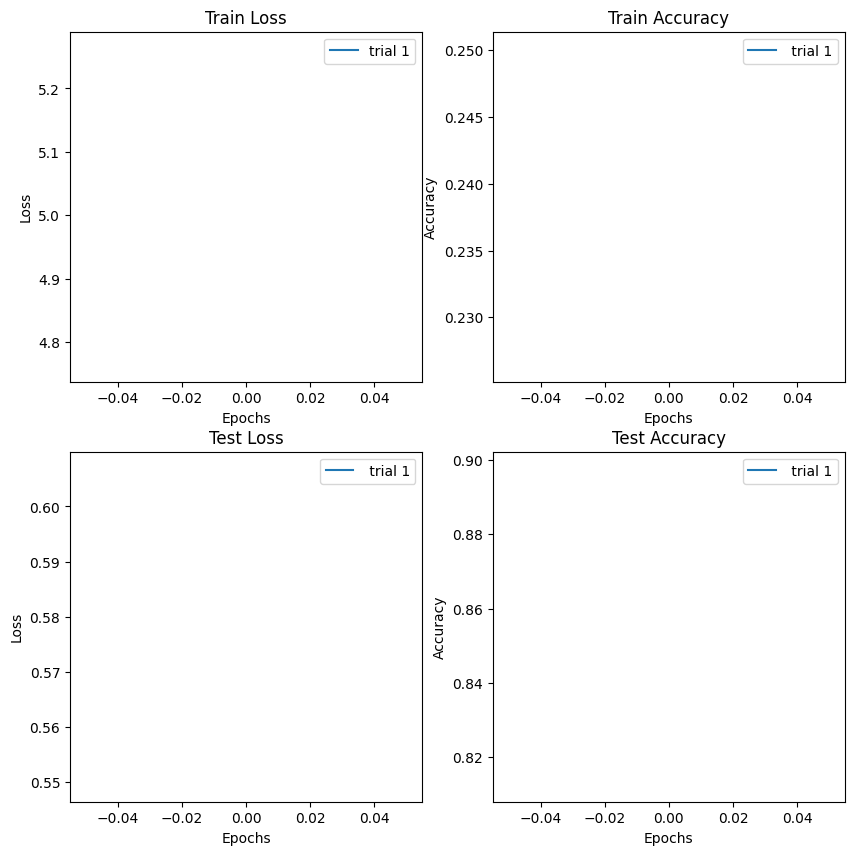

In [ ]:
plot_loss_acc(results_transfer_3)
compare_loss_acc(results_transfer_3)

#### 6.4 Results with Scheduler

The scheduler seems to be doing a lot for stabilising the test loss and accuracy, this would suggest that our model is more generalisable than it was before

on the longer run model we see a minimum in test loss at around the 24th epoch, at which point the model may have started to overfit the train data.

If you find that the oscillations persist for an extended period, it might be worth investigating other aspects of your training setup, such as weight initialization, batch size, or regularization techniques.

#### Weight initialisation
- We want to initialize weights to small, random numbers to break symmetry
- Also we want the weights to be relatively small

causes vanishing/ exploding gradient problems

as our weights are pretrained maybe this is already set. i doubt the linear function would have too much of a knock on type effect for gradient degradation



#### 7. Early Stopping
Early stopping can help prevent overfitting and optimize our models performance by monitoring validation loss during training. we can save computational resources and avoid unnecessary iterations by stopping training when validation loss starts increasing.

PyTorch does not include early stopping so we will need to code it ourselves, or more take it from this guy:
https://github.com/jeffheaton/app_deep_learning/blob/main/t81_558_class_03_4_early_stop.ipynb

We can provide several parameters to the earlys topping object:

- **min_delta** This value should be kept small - it specifies the minimum change that should be considered an improvement
- **patience** How long should the training wait for the validation error to improve
- **restore_best_weights** You should usually set this to true, as it restores the weights to the values they were a when the validation set is the highest

In [ ]:
#Early stopping class
import copy


class EarlyStopping:
    def __init__(self, patience=5, min_delta=0, restore_best_weights=True):
        self.patience = patience
        self.min_delta = min_delta
        self.restore_best_weights = restore_best_weights
        self.best_model = None
        self.best_loss = None
        self.counter = 0
        self.status = ""

    #takes in the model and the validation loss
    def __call__(self, model, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
            #saves the model statedict if the val loss equal to the best loss
            self.best_model = copy.deepcopy(model.state_dict())
        elif self.best_loss - val_loss >= self.min_delta:
          # saves the model statedict if the validation loss has decreased since the best loss
            self.best_model = copy.deepcopy(model.state_dict())
            #sets the best loss to the validation loss
            self.best_loss = val_loss
            # resets the counter
            self.counter = 0
            self.status = f"Improvement found, counter reset to {self.counter}"
        else:
          # if there is no improvement adds one to the counter
            self.counter += 1
            self.status = f"No improvement in the last {self.counter} epochs"
            #if the counter gets larger than the patience it triggers the early stopping
            if self.counter >= self.patience:
                self.status = f"Early stopping triggered after {self.counter} epochs."
                if self.restore_best_weights:
                    model.load_state_dict(self.best_model)
                return True
        return False

In [ ]:
es = EarlyStopping()

#### 7.1 Using the early stopping class

We want to put our early stopping class into our training loop after the testing step

#### 7.1.1 Putting early stopping into the training loop

In [ ]:
from tqdm.auto import tqdm


def train_1(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          scheduler: lr_scheduler.StepLR = None,
          early_stopping = None,
          loss_fn: torch.nn.Module = nn.CrossEntropyLoss(),
          epochs: int = 5):

    # 2. Create empty results dictionary
    results = {"train_loss": [],
        "train_acc": [],
        "test_loss": [],
        "test_acc": []
    }

    # 3. Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc = train_step(model=model,
                                           dataloader = train_dataloader,
                                           loss_fn= nn.CrossEntropyLoss(),
                                           optimizer=optimizer)
        test_loss, test_acc = test_step(model=model,
                                        dataloader = test_dataloader,
                                        loss_fn= nn.CrossEntropyLoss())

        #add in the scheduler
        if scheduler:
          scheduler.step()

        # 4. Print out what's happening
        print(
            f"Epoch: {epoch+1} | "
            f"train_loss: {train_loss:.4f} | "
            f"train_acc: {train_acc:.4f} | "
            f"test_loss: {test_loss:.4f} | "
            f"test_acc: {test_acc:.4f}"
            )


        # 5. Update results dictionary
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)

        #add in early stopping
        if early_stopping:
            if early_stopping(model, test_loss) == True:
              print(f"{early_stopping.status}")
              break
            # print out early stopping status
            print(f"{early_stopping.status}")

    # 6. Return the filled results at the end of the epochs
    return results

#### 7.1.2 Model for early stopping class

In [ ]:
# create the model following the youtube video
import torchvision
import torch
from torchvision import models
from torch import nn

model_transfer_b0_2 =  EfficientNet.from_pretrained('efficientnet-b0')#.to(device)

for param in model_transfer_b0_2.parameters():
    param.requires_grad = True

model_transfer_b0_2.classifier = torch.nn.Sequential(
    nn.Dropout(p = 0.2,
               inplace = True), # what is this
    nn.Linear(in_features = 1280,
              out_features = len(class_names),
              bias = True ).to(device)
  )

# Set requires_grad to True for the parameters in the classifier
for param in model_transfer_b0_2.classifier.parameters():
    param.requires_grad = True

model_transfer_b0_2 = model_transfer_b0_2.to(device)

Loaded pretrained weights for efficientnet-b0


#### 7.1.3 optimizers and scheduler for testing early stopping

In [ ]:
optimizer_transfer_4 = torch.optim.Adam(model_transfer_b0_2.parameters(), lr = 0.001)
scheduler_transfer_4 = lr_scheduler.StepLR(optimizer_transfer_4, step_size = 5, gamma = 0.1)

#### 7.1.4 Training

In [ ]:
results_transfer_4 = train_1(model = model_transfer_b0_2,
        train_dataloader = train_transfer_dataloader_1,
        test_dataloader = test_transfer_dataloader_1,
        optimizer = optimizer_transfer_4,
        scheduler = scheduler_transfer_4,
        early_stopping = es,
        epochs = epochs
        )

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 4.7751 | train_acc: 0.3672 | test_loss: 0.4141 | test_acc: 0.8759



#### 7.1.5 How well is our early stopping working

We are getting accurate readouts which is good. stopping predictably isn't initiated so we need to make sure that is put through.

interestingly after the models statedict is reset from early stopping, the next validation loss actually decreases, this is where we would stop the model from training but it seems as if it can get a lower loss by the statedict reset.

first improvent is get the loop to stop. this was achieved by adding a break in the loop. still not getting the right result.

on the last occasion the loop early stoppped too early, maybe we should add in a minimum loss to achieve before early stopping and if that's not reached after a while to stop it.

### 7.2 Early Stopping Improved

I want to add a section where if the best loss is above 0.3 after 5 epcohs to continue going but if this happens 3 times to stop. I have also added in a grace period which only starts the early stopping algorithm

#### 7.2.1 New early stopping class

In [ ]:
#Early stopping class
import copy


class EarlyStopping1:
    def __init__(self, patience=5, min_delta=0, min_loss = 100, min_loss_patience = 3, grace_period = 5, restore_best_weights=True): # have a high default min loss to negate the min loss if statement
        self.patience = patience
        self.min_delta = min_delta
        self.min_loss = min_loss
        self.min_loss_patience = min_loss_patience
        self.grace_period = grace_period
        self.restore_best_weights = restore_best_weights
        self.best_model = None
        self.best_loss = None
        self.grace_counter = 0
        self.counter = 0
        #add in a min loss counter
        self.min_loss_counter = 0
        self.status = ""

    #takes in the model and the validation loss
    def __call__(self, model, val_loss):

      if self.grace_counter >= 0:
        self.grace_counter += 1
        self.status = f"Early stopping grace period active for {self.grace_period - self.grace_counter} more epochs"
        if self.grace_counter >= self.grace_period:

            if self.best_loss is None:
                self.best_loss = val_loss
                #saves the model statedict if the val loss equal to the best loss
                self.best_model = copy.deepcopy(model.state_dict())
            elif self.best_loss - val_loss >= self.min_delta:
              # saves the model statedict if the validation loss has decreased since the best loss
                self.best_model = copy.deepcopy(model.state_dict())
                #sets the best loss to the validation loss
                self.best_loss = val_loss
                # resets the counter
                self.counter = 0
                self.status = f"Improvement found, counter reset to {self.counter}"

            else:
              # if there is no improvement adds one to the counter
                self.counter += 1
                self.status = f"No improvement in the last {self.counter} epochs"
                #if the counter gets larger than the patience it triggers the early stopping
                if self.counter >= self.patience:

                  #add in the min loss term
                  if self.best_loss >= self.min_loss:
                    self.counter = 0 #reset the main counter to zero
                    self.min_loss_counter += 1 #add one to min_loss counter
                    self.status = f"Minimum loss has not been reached after {self.patience} epochs, {self.min_loss_patience - self.min_loss_counter} attempts remaining"

                    if self.min_loss_counter >= self.min_loss_patience:
                      self.status = f"Minimum loss has not been reached after {self.min_loss_counter} attempts. Early stopping triggered."
                      if self.restore_best_weights:
                        model.load_state_dict(self.best_model)
                      return True

                  else: # in the case where min_loss has been reached
                    self.status = f"Early stopping triggered after {self.counter} epochs."
                    if self.restore_best_weights:
                        model.load_state_dict(self.best_model)
                    return True
        return False

#### 7.2.2 Create an instance of the Early stopping class with a min loss

In [ ]:
 #set our min loss to 0.3, reasonable for what we have seen so far i this problem
es1 = EarlyStopping1(min_loss = 0.3)

#### 7.2.3 Define a test model

In [ ]:
import torchvision
import torch
from torchvision import models
from torch import nn

model_transfer_estest =  EfficientNet.from_pretrained('efficientnet-b0')#.to(device)

for param in model_transfer_estest.parameters():
    param.requires_grad = True

model_transfer_estest.classifier = torch.nn.Sequential(
    nn.Dropout(p = 0.2,
               inplace = True), # what is this
    nn.Linear(in_features = 1280,
              out_features = len(class_names),
              bias = True ).to(device)
  )

# Set requires_grad to True for the parameters in the classifier
for param in model_transfer_estest.classifier.parameters():
    param.requires_grad = True

model_transfer_estest = model_transfer_estest.to(device)

Loaded pretrained weights for efficientnet-b0


#### 7.2.4 set up optimizers and scheduler

In [ ]:
optimizer_transfer_estest = torch.optim.Adam(model_transfer_estest.parameters(), lr = 0.001)
scheduler_transfer_estest = lr_scheduler.StepLR(optimizer_transfer_estest, step_size = 5, gamma = 0.1)

In [ ]:
results_transfer_estest = train_1(model = model_transfer_estest,
        train_dataloader = train_transfer_dataloader_1,
        test_dataloader = test_transfer_dataloader_1,
        optimizer = optimizer_transfer_estest,
        scheduler = scheduler_transfer_estest,
        early_stopping = es1,
        epochs = epochs
        )

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.8189 | train_acc: 0.7422 | test_loss: 0.2783 | test_acc: 0.9583


RuntimeError: ignored

#### 7.2.5 we had a case where min loss was reached but overall the model still was not done fitting - it had run for 7 epochs and the train acc was still low.
to fix this need to look into frequency under min_loss? can also increase the patience in general

lets add a grace period where the early stopping doesn't come into effect:

- adding a grace period makes sure we get over the initial hump and chaos at the start effectively.
- Maybe theres a better way of coding this to do with the large loss variations at the start?
- for now i am happy with the early stopping class

#### 7.2.6 Making predictions with the best model

Saving sushi_round_2.webp to sushi_round_2 (1).webp


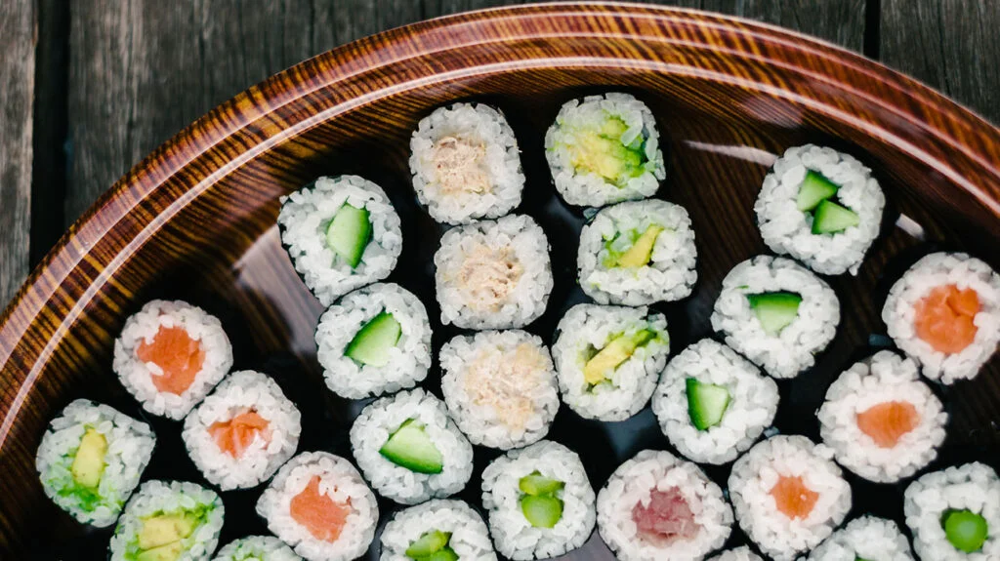

In [ ]:
from google.colab import files
from PIL import Image
import io

# Upload the image file from your local machine to the Colab environment
uploaded = files.upload()

# Get the uploaded file name
file_name = next(iter(uploaded))

# Open the image using PIL (Python Imaging Library)
img = Image.open(io.BytesIO(uploaded[file_name]))

# Display the image
img.show()
img

In [ ]:
transform = transforms.Compose([transforms.Resize(size = (224,224)),
                               transforms.ToTensor()])
img_tensor = transform(img)
img_list = list(img_tensor)

In [ ]:
custom_image_transformed = img_tensor


In [ ]:
model_transfer_estest.eval()
with torch.inference_mode():
    # Add an extra dimension to image
    custom_image_transformed_with_batch_size = custom_image_transformed.unsqueeze(dim=0)

    # Print out different shapes
    print(f"Custom image transformed shape: {custom_image_transformed.shape}")
    print(f"Unsqueezed custom image shape: {custom_image_transformed_with_batch_size.shape}")

    # Make a prediction on image with an extra dimension
    custom_image_pred = model_transfer_estest(custom_image_transformed.unsqueeze(dim=0
                                                                               ).to(device))
custom_image_pred.shape

Custom image transformed shape: torch.Size([3, 224, 224])
Unsqueezed custom image shape: torch.Size([1, 3, 224, 224])


torch.Size([1, 1000])

In [ ]:
custom_image_pred_probs = [custom_image_pred[0][0].cpu(), custom_image_pred[0][1].cpu(), custom_image_pred[0][2].cpu()]
prediction = torch.argmax(custom_image_pred)
prediction_class = class_names[prediction]
print(f"probabilities: {custom_image_pred_probs}")
print(f"prediction: {prediction}")
print(f"prediction class: {prediction_class}" )


probabilities: [tensor(15.5575), tensor(4.2963), tensor(6.3555)]
prediction: 0
prediction class: pizza



It seems like the model's output tensor contains a list of scores for each of the 1000 classes it was originally trained on, rather than just the three classes you are interested in. This is a common scenario when using pre-trained models on ImageNet, which has 1000 classes.

The model has a bias towards pizza for rounded shapes - if sushi is on say a round plate it will detect it as pizza



### 8. Using a newer EfficientNetModel

lets look into using EfficientNet_b2 or higher

#### 8.1 import the efficientnet_b2 model

In [ ]:
# create the model following the youtube video
import torchvision
import torch
from torchvision import models
from torch import nn

model_transfer_b2 =  EfficientNet.from_pretrained('efficientnet-b2')#.to(device)

for param in model_transfer_b2.parameters():
    param.requires_grad = True

model_transfer_b2.classifier = torch.nn.Sequential(
    nn.Dropout(p = 0.2,
               inplace = True), # what is this
    nn.Linear(in_features = 1280,
              out_features = len(class_names),
              bias = True ).to(device)
  )

# Set requires_grad to True for the parameters in the classifier
for param in model_transfer_b2.classifier.parameters():
    param.requires_grad = True

model_transfer_b2 = model_transfer_b2.to(device)

ValueError: ignored

#### 8.2 Set up the optimisers

In [ ]:
optimizer_transfer_b2 = torch.optim.Adam(model_transfer_b2.parameters(), lr = 0.001)
scheduler_transfer_b2 = lr_scheduler.StepLR(optimizer_transfer_b2, step_size = 10, gamma = 0.1)

#### 8.3 Creat an instance of early stopping class

In [ ]:
es2 = EarlyStopping1(min_loss = 0.3)

#### 8.4 Train

In [ ]:
results_transfer_5 = train_1(model = model_transfer_b2,
        train_dataloader = train_transfer_dataloader_1,
        test_dataloader = test_transfer_dataloader_1,
        optimizer = optimizer_transfer_b2,
        scheduler = scheduler_transfer_b2,
        early_stopping = es2,
        epochs = 60
        )

NameError: ignored

#### 8.6 Results
The results are very similar to that of efficentnet_b0 and can actually be seen a slightly worse. We ran for longer as well. as b2 takes more computing power to run lets stick to b0.

Will training bagging work to improve here? it seems like the model is struggling with specific features of the data. I think the next step for improving would be to add more data and hopefully this will include greater variation. Also adding in more data augmentation will add variation. split data augmentations like we did before with the bagging would definitely achieve this. Is data augmentation and adding more data going to be enough to stop our model from predicting sushi on a round plate to be pizza though?

### 9. Training on more data

We have a 20% food database that we can use to better train our model.

we can even bag our model as well here to see if we can achieve even higher results. currently our best consistent test accuracy has been around 95%

Lets run on more data which is pretty straight forward to do and think about how we can create a bagged training loop which is more generalizable.

#### 9.1 Import our data

In [ ]:
#### Getting the 20% code
import os
import requests
import zipfile

from pathlib import Path

# Setup path to data folder
data_path = Path("Data/")
image_path = data_path / "pizza_steak_sushi_20_percent"
image_data_zip_path = "pizza_steak_sushi_20_percent.zip"

# If the image folder doesn't exist, download it and prepare it...
if image_path.is_dir():
    print(f"{image_path} directory exists.")
else:
    print(f"Did not find {image_path} directory, creating one...")
    image_path.mkdir(parents=True, exist_ok=True)

    # Download pizza, steak, sushi data
    with open(data_path / image_data_zip_path, "wb") as f:
        request = requests.get("https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi_20_percent.zip")
        print("Downloading pizza, steak, sushi data...")
        f.write(request.content)

    # Unzip pizza, steak, sushi data
    with zipfile.ZipFile(data_path / image_data_zip_path, "r") as zip_ref:
        print("Unzipping pizza, steak, sushi 20% data...")
        zip_ref.extractall(image_path)

    # Remove .zip file
    os.remove(data_path / image_data_zip_path)

# Setup Dirs
train_dir_20_percent = image_path / "train"
test_dir_20_percent = image_path / "test"

train_dir_20_percent, test_dir_20_percent


Did not find Data/pizza_steak_sushi_20_percent directory, creating one...
Unzipping pizza, steak, sushi 20% data...


(PosixPath('Data/pizza_steak_sushi_20_percent/train'),
 PosixPath('Data/pizza_steak_sushi_20_percent/test'))

In [ ]:
import numpy as np
import torch
import torch.optim as optim
from torch.optim import lr_scheduler # scheduler can change the learning rate
import random
from PIL import Image
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import os
import matplotlib.pyplot as plt
import copy
import time

In [ ]:
from torch import nn

#### 9.2 Work plan

So I want to train a number of bags which i want to be able to vary. to train each bag:

- I will need to bag the data
- the Bagged data will then have some optional augmentation applied to it
- the Bagged data will then be put into dataloaders.
- for each bag an instance of the model will have to be created
- then an optimizer and a scheduler will also have to be created
- want to train using early stopping so a class will have to be created for each
- and then that model can be trained.
- after each model is trained we want to save and return the model with the best weights
- the models can then be compiled into one model with weights


#### 9.3 Create device agnostic code

In [ ]:
device = 'cuda' if torch.cuda.is_available else 'cpu'
#device = 'cpu'


def TrainEfficientNetBagged(train_data: datasets.ImageFolder,
                            test_data: datasets.ImageFolder ,
                            early_stopping = None,
                            num_bags: int = 10,
                            batch_size: int = 32,
                            device = device):

#### 9.4 Training and testing functions and loop

In [ ]:
from tqdm.auto import tqdm

#essential functions
def train_step(model: torch.nn.Module,
              dataloader: torch.utils.data.DataLoader,
              loss_fn: torch.nn.Module,
              optimizer: torch.optim.Optimizer):
  # Put model in train mode
  model.train()

  # Setup train loss and train accuracy values
  train_loss, train_acc = 0, 0

  # Loop through data loader data batches
  for batch, (X, y) in enumerate(dataloader):
      # Send data to target device
      X, y = X.to(device), y.to(device)

      # 1. Forward pass
      y_pred = model(X)

      # 2. Calculate  and accumulate loss
      loss = loss_fn(y_pred, y)
      train_loss += loss.item()

      # 3. Optimizer zero grad
      optimizer.zero_grad()

      # 4. Loss backward
      loss.backward()

      # 5. Optimizer step
      optimizer.step()

      # Calculate and accumulate accuracy metric across all batches
      y_pred_class = torch.argmax(torch.softmax(y_pred, dim=1), dim=1)
      train_acc += (y_pred_class == y).sum().item()/len(y_pred)

  # Adjust metrics to get average loss and accuracy per batch
  train_loss = train_loss / len(dataloader)
  train_acc = train_acc / len(dataloader)
  return train_loss, train_acc

def test_step(model: torch.nn.Module,
                dataloader: torch.utils.data.DataLoader,
                loss_fn: torch.nn.Module):
      # Put model in eval mode
      model.eval()

      # Setup test loss and test accuracy values
      test_loss, test_acc = 0, 0

      # Turn on inference context manager
      with torch.inference_mode():
          # Loop through DataLoader batches
          for batch, (X, y) in enumerate(dataloader):
              # Send data to target device
              X, y = X.to(device), y.to(device)

              # 1. Forward pass
              test_pred_logits = model(X)

              # 2. Calculate and accumulate loss
              loss = loss_fn(test_pred_logits, y)
              test_loss += loss.item()

              # Calculate and accumulate accuracy
              test_pred_labels = test_pred_logits.argmax(dim=1)
              test_acc += ((test_pred_labels == y).sum().item()/len(test_pred_labels))

      # Adjust metrics to get average loss and accuracy per batch
      test_loss = test_loss / len(dataloader)
      test_acc = test_acc / len(dataloader)
      return test_loss, test_acc

#training loop
def train(model: torch.nn.Module,
        train_dataloader: torch.utils.data.DataLoader,
        test_dataloader: torch.utils.data.DataLoader,
        optimizer: torch.optim.Optimizer,
        scheduler: lr_scheduler.StepLR = None,
        early_stopping = None,
        loss_fn: torch.nn.Module = nn.CrossEntropyLoss(),
        epochs: int = 5):

  # 2. Create empty results dictionary
  results = {"train_loss": [],
      "train_acc": [],
      "test_loss": [],
      "test_acc": []
  }

  # 3. Loop through training and testing steps for a number of epochs
  for epoch in tqdm(range(epochs)):
      train_loss, train_acc = train_step(model=model,
                                          dataloader = train_dataloader,
                                          loss_fn= nn.CrossEntropyLoss(),
                                          optimizer=optimizer)
      test_loss, test_acc = test_step(model=model,
                                      dataloader = test_dataloader,
                                      loss_fn= nn.CrossEntropyLoss())

      #add in the scheduler
      if scheduler:
        scheduler.step()

      # 4. Print out what's happening
      print(
          f"Epoch: {epoch+1} | "
          f"train_loss: {train_loss:.4f} | "
          f"train_acc: {train_acc:.4f} | "
          f"test_loss: {test_loss:.4f} | "
          f"test_acc: {test_acc:.4f}"
          )


      # 5. Update results dictionary
      results["train_loss"].append(train_loss)
      results["train_acc"].append(train_acc)
      results["test_loss"].append(test_loss)
      results["test_acc"].append(test_acc)

      #add in early stopping
      if early_stopping:
          if early_stopping(model, test_loss) == True:
            print(f"{early_stopping.status}")
            break
          # print out early stopping status
          print(f"{early_stopping.status}")

  # 6. Return the filled results at the end of the epochs
  return results



#### 9.5 define our class for early stopping

In [ ]:

class EarlyStopping1:
    def __init__(self, patience=5, min_delta=0, min_loss = 100, min_loss_patience = 3, grace_period = 5, restore_best_weights=True): # have a high default min loss to negate the min loss if statement
        self.patience = patience
        self.min_delta = min_delta
        self.min_loss = min_loss
        self.min_loss_patience = min_loss_patience
        self.grace_period = grace_period
        self.restore_best_weights = restore_best_weights
        self.best_model = None
        self.best_loss = None
        self.grace_counter = 0
        self.counter = 0
        #add in a min loss counter
        self.min_loss_counter = 0
        self.status = ""

    #takes in the model and the validation loss
    def __call__(self, model, val_loss):

      if self.grace_counter >= 0:
        self.grace_counter += 1
        self.status = f"Early stopping grace period active for {self.grace_period - self.grace_counter} more epochs"
        if self.grace_counter >= self.grace_period:

            if self.best_loss is None:
                self.best_loss = val_loss
                #saves the model statedict if the val loss equal to the best loss
                self.best_model = copy.deepcopy(model.state_dict())
            elif self.best_loss - val_loss >= self.min_delta:
              # saves the model statedict if the validation loss has decreased since the best loss
                self.best_model = copy.deepcopy(model.state_dict())
                #sets the best loss to the validation loss
                self.best_loss = val_loss
                # resets the counter
                self.counter = 0
                self.status = f"Improvement found, counter reset to {self.counter}"

            else:
              # if there is no improvement adds one to the counter
                self.counter += 1
                self.status = f"No improvement in the last {self.counter} epochs"
                #if the counter gets larger than the patience it triggers the early stopping
                if self.counter >= self.patience:

                  #add in the min loss term
                  if self.best_loss >= self.min_loss:
                    self.counter = 0 #reset the main counter to zero
                    self.min_loss_counter += 1 #add one to min_loss counter
                    self.status = f"Minimum loss has not been reached after {self.patience} epochs, {self.min_loss_patience - self.min_loss_counter} attempts remaining"

                    if self.min_loss_counter >= self.min_loss_patience:
                      self.status = f"Minimum loss has not been reached after {self.min_loss_counter} attempts. Early stopping triggered."
                      if self.restore_best_weights:
                        model.load_state_dict(self.best_model)
                      return True

                  else: # in the case where min_loss has been reached
                    self.status = f"Early stopping triggered after {self.counter} epochs."
                    if self.restore_best_weights:
                        model.load_state_dict(self.best_model)
                    return True
        return False

In [ ]:
class EarlyStopping1:
    def __init__(self, patience=5, min_delta=0, min_loss = 100, min_loss_patience = 3, grace_period = 5, restore_best_weights=True): # have a high default min loss to negate the min loss if statement
        self.patience = patience
        self.min_delta = min_delta
        self.min_loss = min_loss
        self.min_loss_patience = min_loss_patience
        self.grace_period = grace_period
        self.restore_best_weights = restore_best_weights
        self.best_model = None
        self.best_loss = None
        self.grace_counter = 0
        self.counter = 0
        #add in a min loss counter
        self.min_loss_counter = 0
        self.status = ""

    #takes in the model and the validation loss
    def __call__(self, model, val_loss):

      if self.grace_counter >= 0:
        self.grace_counter += 1
        self.status = f"Early stopping grace period active for {self.grace_period - self.grace_counter} more epochs"

        if self.best_loss is None:
          #set the first value of val_loss
          self.best_loss = val_loss
          self.best_model = copy.deepcopy(model.state_dict())

        if self.best_loss - val_loss >= self.min_delta:

          #saves the model statedict if the validation loss has decreased since the best loss
          self.best_model = copy.deepcopy(model.state_dict())
          #sets the best loss to the validation loss
          self.best_loss = val_loss

        if self.grace_counter >= self.grace_period:

            if self.best_loss - val_loss >= self.min_delta:
              # saves the model statedict if the validation loss has decreased since the best loss
                self.best_model = copy.deepcopy(model.state_dict())
                #sets the best loss to the validation loss
                self.best_loss = val_loss
                # resets the counter
                self.counter = 0
                self.status = f"Improvement found, counter reset to {self.counter}"

            else:
              # if there is no improvement adds one to the counter
                self.counter += 1
                self.status = f"No improvement in the last {self.counter} epochs"
                #if the counter gets larger than the patience it triggers the early stopping
                if self.counter >= self.patience:

                  #add in the min loss term
                  if self.best_loss >= self.min_loss:
                    self.counter = 0 #reset the main counter to zero
                    self.min_loss_counter += 1 #add one to min_loss counter
                    self.status = f"Minimum loss has not been reached after {self.patience} epochs, {self.min_loss_patience - self.min_loss_counter} attempts remaining"

                    if self.min_loss_counter >= self.min_loss_patience:
                      self.status = f"Minimum loss has not been reached after {self.min_loss_counter} attempts. Early stopping triggered."
                      if self.restore_best_weights:
                        model.load_state_dict(self.best_model)
                      return True

                  else: # in the case where min_loss has been reached
                    self.status = f"Early stopping triggered after {self.counter} epochs."
                    if self.restore_best_weights:
                        model.load_state_dict(self.best_model)
                    return True
        return False

#### 9.6 Define our data and some HyperParameters

In [ ]:
#training hyperparameters
NUM_BAGS = 1
EPOCHS = 20

#data loader hyperparameters
BATCH_SIZE = 32
NUM_WORKERS = os.cpu_count()

#Augementation Hyperparameters for trivial augment wide
AUG_MAG = 41  # default is 31
AUG_RANGE = 20 # randomizes augmentation across bags adding or subtracting a max of AUG_RANGE

#early stopping hyperparameters
GRACE_PERIOD = 8
PATIENCE = 8

#optimizer hyperparameters
LEARNING_RATE = 0.0007
WEIGHT_DECAY = 0.0001

#scheduler hyperparameters
STEP_SIZE = 15
GAMMA = 0.1


#### 9.7 - Adding Data Augmentation (3rd training edit)

We want to augment our data before training to add variation and limit overfitting. we can edit our data in slightly different ways for each bag to further increase this variation.

code:
have a for loop to create num_bags transforms and then open num_bags image folders with the data in

In [ ]:
import torchvision.transforms
from torchvision.transforms import v2
import random

# mean and std values are set
mean , std =  [0.485,0.456,0.406] , [0.229,0.224,0.225]

#create an empty dictionary for the transforms
train_transforms = []

for n in range(NUM_BAGS):

  random_int = random.randint(-AUG_RANGE,AUG_RANGE)
  num_bins = AUG_MAG + random_int

  train_transform = v2.Compose([
                                v2.RandomResizedCrop(224),
                                v2.RandomHorizontalFlip(),
                                v2.ToTensor(),
                                v2.TrivialAugmentWide(num_magnitude_bins = (num_bins)),
                                v2.Normalize(mean,std)
                                ])

  train_transforms.append(train_transform)



test_transform = transforms.Compose([
                                    transforms.Resize(size= (224,224)),
                                    transforms.ToTensor(),
                                    transforms.Normalize(mean, std)
])

train_transforms[0]

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/v2/_deprecated.py:43: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.
  warnings.warn(


Compose(
      RandomResizedCrop(size=(224, 224), scale=(0.08, 1.0), ratio=(0.75, 1.3333333333333333), interpolation=InterpolationMode.BILINEAR, antialias=warn)
      RandomHorizontalFlip(p=0.5)
      ToTensor()
      TrivialAugmentWide(interpolation=InterpolationMode.NEAREST, num_magnitude_bins=55)
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225], inplace=False)
)

#### 9.8 Opening the data

We want to open the data with each transform and append to a list of data.

In [ ]:
train_dataset = []


for n in range(NUM_BAGS):

  transform = train_transforms[n]

  train_data = datasets.ImageFolder(transform = transform,
                                root = train_dir,
                                target_transform = None)

  train_dataset.append(train_data)

test_dataset = datasets.ImageFolder(transform = test_transform,
                                 root = test_dir)

In [ ]:
#define class names for model training
class_names = test_dataset.classes

#### 9.9 Visualise augmented data across the bags

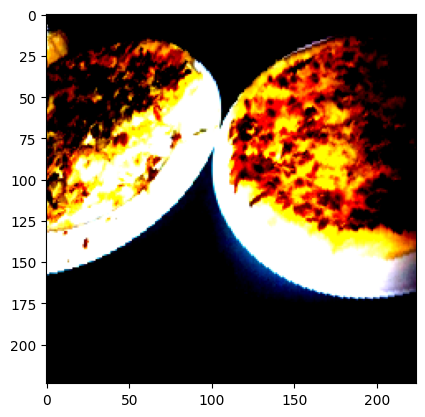

In [ ]:
for n in range(NUM_BAGS):

  img, lbl = train_dataset[n][0]

  plt.imshow(img.permute(1,2,0))
  plt.show()


#### 9.10 Effects of Augmentation

we have essentially went from one image to 10 different images with different features being highlighted and noise added to them.

#### 9.11 Bagging data and putting into dataloaders

In [ ]:
#bagging function
def bag_data(dataset):

  import random

  subset_size = int(0.6 * len(dataset)) # calculate the size of the subset

  random_subset = random.choices(dataset, k = subset_size) #pick random data

  return random_subset

#empty train dataloaders dict
train_dataloaders = []

#create bagged train dataloaders
for n in range(NUM_BAGS):

    train_data_bag = bag_data(train_dataset[n])
    train_dataloader_bag = DataLoader(dataset = train_data_bag, batch_size = BATCH_SIZE)


    train_dataloaders.append(train_dataloader_bag)

#empty test_dataloaders dict
test_dataloaders = []

#create test dataloaders
for n in range(NUM_BAGS):

  test_dataloader = DataLoader(dataset = test_dataset, batch_size = BATCH_SIZE)

  test_dataloaders.append(test_dataloader)

#### 9.12 Creating our models

In [ ]:
!pip install efficientnet-pytorch
!pip install --upgrade efficientnet-pytorch
from efficientnet_pytorch import EfficientNet

from torch import nn

# empty models dict
models = []

# create our models
for n in range(NUM_BAGS):
    model = EfficientNet.from_pretrained('efficientnet-b0')

    for param in model.parameters():
        param.requires_grad = True

    model.classifier = torch.nn.Sequential(
    nn.Dropout(p = 0.2,
              inplace = True), # what is this
    nn.Linear(in_features = 1280,
              out_features = len(class_names),
              bias = True ))

    for param in model.classifier.parameters():
        param.requires_grad = True

    model = model.to(device)

    models.append(model)

  Preparing metadata (setup.py) ... done
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16428 sha256=26afd2d4a61c16e6bde5eac18fdd1f8afe341ca7a939c0f703f2a7fb6c8b72b5
  Stored in directory: /root/.cache/pip/wheels/03/3f/e9/911b1bc46869644912bda90a56bcf7b960f20b5187feea3baf
Successfully built efficientnet-pytorch


Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b0-355c32eb.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b0-355c32eb.pth
100%|██████████| 20.4M/20.4M [00:00<00:00, 308MB/s]


Loaded pretrained weights for efficientnet-b0


####9.13 Define EarlyStopping classes

In [ ]:
early_stopping_fns = []

for n in range(NUM_BAGS):
  es = EarlyStopping1(grace_period = GRACE_PERIOD,
                      patience = PATIENCE)

  early_stopping_fns.append(es)

early_stopping_fns

#### 9.14 Training the models

In [ ]:
#create an empty results dict
results = []

import time
t0 = time.time()

#loop through the training loops
for n in range(NUM_BAGS):

  optimizer = torch.optim.Adam(models[n].parameters(), lr = LEARNING_RATE, weight_decay = WEIGHT_DECAY)
  scheduler = lr_scheduler.StepLR(optimizer, step_size = STEP_SIZE, gamma = 0.1)
  print(f"Starting training for bag {n}")
  result = train(model = models[n],
        train_dataloader = train_dataloaders[n],
        test_dataloader = test_dataloaders[n],
        optimizer = optimizer,
        scheduler = scheduler,
        early_stopping = None, #early_stopping_fns[n],
        loss_fn = nn.CrossEntropyLoss(),
        epochs = EPOCHS)

  results.append(result)


print(f"time for experiment: {time.time() - t0}")

Starting training for bag 0


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 6.4626 | train_acc: 0.0598 | test_loss: 5.7060 | test_acc: 0.0303
Epoch: 2 | train_loss: 1.9002 | train_acc: 0.8214 | test_loss: 2.0276 | test_acc: 0.5142
Epoch: 3 | train_loss: 0.3875 | train_acc: 0.9812 | test_loss: 0.6006 | test_acc: 0.8144
Epoch: 4 | train_loss: 0.1189 | train_acc: 0.9938 | test_loss: 0.5741 | test_acc: 0.8655
Epoch: 5 | train_loss: 0.0316 | train_acc: 1.0000 | test_loss: 0.6809 | test_acc: 0.8447
Epoch: 6 | train_loss: 0.0120 | train_acc: 1.0000 | test_loss: 0.8485 | test_acc: 0.8447
Epoch: 7 | train_loss: 0.0110 | train_acc: 1.0000 | test_loss: 0.8980 | test_acc: 0.8447
Epoch: 8 | train_loss: 0.0094 | train_acc: 1.0000 | test_loss: 0.8963 | test_acc: 0.8447
Epoch: 9 | train_loss: 0.0036 | train_acc: 1.0000 | test_loss: 0.7169 | test_acc: 0.8551
Epoch: 10 | train_loss: 0.0021 | train_acc: 1.0000 | test_loss: 0.5795 | test_acc: 0.8864
Epoch: 11 | train_loss: 0.0016 | train_acc: 1.0000 | test_loss: 0.5052 | test_acc: 0.8968
Epoch: 12 | train_l

#### Investigating GPU efficiency

what is overhead:

overhead is time spent doing anything that's not transfering tensors or computing things. overhead is a problem because gpus are a lot faster than python.
While PyTorch is running a CUDA kernel, it can continue and queue up more CUDA kernels behind it. So, as long as PyTorch can "run ahead" of the CUDA kernels, most of the framework overhead gets completely hidden!

check for over head by increasing data (doubling batch size) and seeing if runtime increases

batch = 16 5 epochs -> 14.8 (21.14) seconds
16 20 epochs -> 63.86 seconds
32 20 epochs -> 64 seconds.
batch = 32 -> 16.86 seconds

I'm not sure this is a good tester lets try with doubling the data size:

halving data

20% data = 64 seconds
10% data = 35 seconds

looks like there's not too much overhead



#### 9.15 Model selection and weights

In [ ]:
def model_weights(models, results, MIN_LOSS, WEIGHT_DELTA, WEIGHT_MAG):
  # Create empty lists for our best models and weights
  models_best = []
  weights = []

  for n in range(len(models)):
      loss = torch.tensor(results[n]["test_loss"])
      min_loss = torch.min(loss)

      if min_loss <= MIN_LOSS:
          models_best.append(models[n])

          #Append weight values to weights list
          if MIN_LOSS - (2*WEIGHT_DELTA) < min_loss <= MIN_LOSS:
              weights.append(1)

          elif MIN_LOSS - (3*WEIGHT_DELTA) < min_loss <= MIN_LOSS - (2*WEIGHT_DELTA):
              weights.append(1 + WEIGHT_MAG)

          else:
              # Add a condition here if needed
              weights.append(1 + 2*WEIGHT_MAG)

  return models_best, weights



In [ ]:
models_best, weights = model_weights(models = models,
                                     results = results,
                                     MIN_LOSS = 0.3,
                                     WEIGHT_DELTA = 0.05,
                                     WEIGHT_MAG = 2)

weights

[]

#### add weights into the ensembled class then we should be good to go

#### Adding some weights to the models

the models return logits so maybe we can just multiply these?

#### could be interesting to code a models_best = 10 into the loops

#### Results of testing the hyperparameters

new early stopping with no min_loss stops a lot earlier saving computational power, still not learning fast on test set at the start maybe can increase learning rate. also the data fits the train set veryyy quickly to 100% accuracy. look into adding augmentation

upping the learning rate to 0.01 does not improve performance - loss gets very high very quickly

lowering learning rate and increasing step size - pretty good performance lr = 0.0005, step size = 15,  final acc = 93.3 final loss = 0.25

increasing step size to 20 good results - acc = 91% loss = 0.39

**keeping lr = 0.0005, step = 15, gamma = 0.1**

batch_size to 64, much faster training to 91% acc however higher loss at around 65%

**batch size to 16**, very good results, peak accuracy = 94.4%, min loss = 0.26. no blow up seen at the beggining, second run accuracy max = 95.2% , loss min = 0.1754, third run max acc = 95.63%, min loss = 0.1776. fourth run max acc = 91.9% min loss = 0.35

slightly higher learning rate led less stable results

gamma = 0.2 decent, reached 90, losss = 0.4

a lot of the results seen are also due to variations in the starting weights. as the weights are frozen for the transfer learning section we can look into our linear layers weights.

#### **Adding weight decay into the adam optimizer**

0.00005 - still good results, very similar, training gets to 100% quick still 6 epochs, test acc to 93

0.0001 - best yet - 96% accuracy, 0.14 loss, 2nd attempt 96.25% accuracy 0.215 loss in 14 epochs (much faster!)

#### Further considerations

- Batch normalization
- dropout regularization
-

In [ ]:
#plot_loss_acc(results[0])

#### Chat GPT on training accuracy

Achieving 100% accuracy on the training data could be a cause for concern and might indicate potential issues. While high training accuracy is often a desirable goal, it's crucial to consider the following aspects:

Overfitting:

Attaining 100% accuracy on the training data could be a sign of overfitting. Overfitting occurs when the model learns the training data too well, capturing noise and outliers instead of general patterns. This might result in poor generalization to new, unseen data.
Data Mismatch:

Check for any issues with the data. It's possible that there's a mismatch between the training and test datasets. If the training data is not representative of the test data, the model may not generalize well.
Model Complexity:

A model that is too complex for the given task might memorize the training data rather than learning meaningful patterns. Consider simplifying the model architecture or applying regularization techniques.
Data Leakage:

Ensure that there is no data leakage, where information from the test set is unintentionally included in the training set. This can lead to overly optimistic performance estimates.
Evaluation on Test Set:

Always evaluate the model on a separate test set to assess its performance on unseen data. If the model's accuracy is significantly lower on the test set, it suggests a lack of generalization.
Class Imbalance:

Check for class imbalance in your dataset. If there are significantly more samples from one class, the model might learn to favor that class, leading to high accuracy but poor generalization.
If your model is indeed overfitting, you might want to consider implementing strategies to address this issue:

Regularization Techniques: Apply techniques such as dropout, L2 regularization, or batch normalization to prevent overfitting.

Data Augmentation: If applicable (e.g., for image data), use data augmentation to artificially increase the size of your training set.

Cross-Validation: Use cross-validation to get a better estimate of your model's performance across different subsets of the data.

Simplify the Model: Consider reducing the complexity of your model.

#### The Model works, training works, everything is good and we can edit for different amounts of bags

#### 9.10 Ensembling the models

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class MyEnsembledModel(nn.Module):
    def __init__(self, models):
        """
        Initialize the ensembled model with a list of pre-trained models.

        Parameters:
        - models (list): List of pre-trained models.
        """
        super(MyEnsembledModel, self).__init__()
        self.models = nn.ModuleList(models)

    def forward(self, X):
        """
        Perform the forward pass and return aggregated logits.

        Parameters:
        - X (Tensor): Input data for prediction.

        Returns:
        - logits (Tensor): Aggregated logits.
        """
        # Generate logits for each model
        logits_list = [model(X) for model in self.models]

        # Aggregate logits (you can use simple averaging here)
        aggregated_logits = torch.mean(torch.stack(logits_list), dim=0)

        return aggregated_logits

In [ ]:
model_bagged = MyEnsembledModel(models)

In [ ]:
class MyEnsembledModelWeights(nn.Module):
    def __init__(self, models, weights):
        """
        Initialize the ensembled model with a list of pre-trained models and weights.

        Parameters:
        - models (list): List of pre-trained models.
        """
        super(MyEnsembledModelWeights, self).__init__()
        self.models = nn.ModuleList(models)
        self.weights = weights

    def forward(self, X):
        """
        Perform the forward pass and returns weighted aggregated logits.

        Parameters:
        - X (Tensor): Input data for prediction.

        Returns:
        - weighted logits (Tensor): Aggregated logits.
        """
        logits_list = []

        for n in range(len(self.models)):


            # Generate logits for each model
            logits = self.weights[n] * self.models[n](X)

            #append to logits list
            logits_list.append(logits)
        print(n)
        # Aggregate logits (you can use simple averaging here)
        aggregated_logits = torch.mean(torch.stack(logits_list), dim=0)

        return aggregated_logits

In [ ]:
weights_tensor = torch.tensor(weights)
model_bagged_weighted = MyEnsembledModelWeights(models = models_best,
                                                weights = weights_tensor)



#### 9.11 Check final accuracy of the modal on the test data set

In [ ]:
def make_predictions(model: torch.nn.Module, data: list, device: torch.device = device):
    pred_probs = []
    pred_logits = []
    labels = []
    model.eval()
    with torch.inference_mode():
        for sample in data:
            # Prepare sample
            image, label = sample

            image = torch.unsqueeze(image, dim=0).to(device) # Add an extra dimension and send sample to device

            # Forward pass (model outputs raw logit)
            pred_logit = model(image)

            # Get prediction probability (logit -> prediction probability)
            pred_prob = torch.softmax(pred_logit.squeeze(), dim=0) # note: perform softmax on the "logits" dimension, not "batch" dimension (in this case we have a batch size of 1, so can perform on dim=0)

            # Get pred_prob off GPU for further calculations
            pred_probs.append(pred_prob)

            pred_logits.append(pred_logit)

            labels.append(label)

    # Stack the pred_probs to turn list into a tensor
    return torch.stack(pred_probs), torch.stack(pred_logits), labels

In [ ]:
pred_probs, pred_logits, labels = make_predictions(model = model_bagged_weighted,
                                           data = test_dataset)

4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4


In [ ]:
predictions = torch.argmax(pred_probs, dim = 1)
predictions_tensor = predictions.cpu() == torch.tensor(labels)

In [ ]:
# Compare predictions with ground truth labels
correct_predictions = (predictions_tensor)

# Calculate the accuracy by taking the mean of the correct predictions
accuracy = correct_predictions.sum().item()/len(predictions) * 100.0

print(f"Accuracy: {accuracy:.2f}%")
print()

Accuracy: 98.67%



#### **9.12.1 Evaluation of the First large model run**

**Initial thoughts:**

Min_loss seems somewhat obselete with the grace period given. Some models loss is not dropping very low - this will be due to the learning rate. we are also seeing some overfitting across the models.

Our train accuracy is hitting 100% very quickly which also suggests overfitting to the train dataset - maybe the more data is allowing our model to spot patterns quicker so the parameters are somewhat obselete for this model. maybe we need to add in varied data augmentation to try and limit this. compared to the smaller data model I think we are actuallly getting worse results in a case by case basis. We can go back down to 1 model and fine tune the hyperparameters so that loss is consistently getting low and each model consistently predicts on the validation data. peak accuracy for each bag varies from 87% to 95% which is quite a big range, ideally most our models would have an accuracy 92%+ as seen in the previous training.

Also would be good to print out which bag we are training just to keep track as it trains for a while and there is no overall indication of the total progress of the training.

The model overall achieved 95.33% accuracy which is the best accuracy reached on this problem to date! however a lot of computational power has been wasted here when you consider that 95.03% was the highest accuracy achived in one of the bags.  Is 0.3% worth 10 x the computing power? probably not, but it does provide more consistencey across models as only 2/10 of the bags were able to achieve this accuracy.  

**Selected images:**

- The model was able to deduce that both round sushi plates were in fact sushi and not pizza suggesting better generalization. this is definitely an improvement from the previous models.

- It was not able to predict on round steak and rice image, going for pizza with a prob tensor [tensor(10.0788), tensor(8.5350), tensor(7.5594)].

- It was not able to predict on round steak and rice 2 eaither but had very close probabilities:  [tensor(5.5329), tensor(10.3086), tensor(10.3696)]
(can't really blame it but at least it didn't pick pizza!)

- round steak and rice with egg: [tensor(-0.1529), tensor(7.1186), tensor(13.6770)] it would seem reasonably that the model has a bias to choose sushi for somewhat cluttered yet ordered plates containing rice

- steak salad it went for pizza, could be attributed to the percieved lots of toppings, could almost be a pizza but i reckon all humans could tell the difference in these images. the probs: [tensor(9.6245), tensor(7.5844), tensor(3.0704)]

- steak salad 2 it got there which is impressive! maybe due to more greenery? [tensor(6.0972), tensor(9.2360), tensor(6.7842)]

**Model improvements:**

- give higher weights to better performing models in the bag
- fine tune hyperparameters to match the neeeds of the data
- data augmentation to increase variation and limit overfitting
- presentation i.e printing out the bag number that we get to
- adjusting the early stopping, removing min loss asthis has lead to lots of unnecessary computation.

#### **9.12.2 Fine tuning of hyper parameters**

Fine tuning of hyper parameters with adjustments made to early stopping has got us a much faster training model (5 mins vs 20 mins) with a higher accuracy of 96%

**Selected Images**

- model predicts steak on steak salad 1 [tensor(6.4188), tensor(7.7731), tensor(0.9155)] still with high probs on pizza though.

- somehow the prediction is out of bounds for sushi round 2 idk how... 574 lol

- steak on rice 1 it got it correct probabilities: [tensor(2.6116), tensor(8.1911), tensor(6.4317)] with a decent majority

- steak sushi it got sushi [tensor(0.3535), tensor(4.9337), tensor(7.0329)] which is good as i think thats what people would choose

- green pizza it went with steak then sushi before pizza [tensor(6.6419), tensor(8.8840), tensor(0.8780)]. no green pizzas to train off... sayang

**Next Improvements**:

we are going to incorpoorate data augmentation to our model. this can be applied before the data is being passed to data loaders.






#### **9.12.3 Data Augmentation**

**Initial Thoughts**

the model achieved an accuracy of 96.00% which ties our best yet, it was maybe held down by a few lesser models - maybe we could define a minimum loss that we want to achieve in our models and if this isn't reached, discount the model?

**Selected images**

It can predict on green pizza now which is an improvement [tensor(8.3922), tensor(5.5355), tensor(0.0630)] suggesting more generalisability.

round steak with egg and rice [tensor(0.2545), tensor(8.9453), tensor(9.4405)] still not predicting steak but closer than before

incorrect on sushi round 2 [tensor(7.0360), tensor(1.7356), tensor(4.6567)] suggesting maybe a bias towards pizzas

very strong for steak on steak salad 2[tensor(5.3453), tensor(11.7419), tensor(4.5180)]

close but still guessed pizza on steak salad 1 [tensor(8.6397), tensor(8.4500), tensor(-1.2885)]

**Improvements**

- what if we combined this model and the other 96% model it seems they have slightly different biases. you can see from the selected images that maybe they will be able to function together. to get the correct outcomes.

#### **9.12.4 Second run augmented**

this time we achieved a base accuracy of 97.33%, we are also attempting to add weights and select the best performing models in this run ( MIN_LOSS = 0.3),

predictably removing the 1 model under min_loss did not improve the model. how about applying loss based weights?

#### **9.12.5 weighted models**

ran for 20 epochs applying loss based weights. the best accuracy achieved across the models was 98.14%

min_loss = 0.4, weights delta = 0.07, weights = 0.5
test_accuracy = 97.33%
validation_data = 91.84%

min_loss = 0.4, weights delta = 0.07, weights = 1
test_accuracy = 98.00

min_loss = 0.4, weights delta = 0.07, weights = 2 (135)
test_accuracy = 98.67%
validation_accuracy = 91.16%

min_loss = 0.4, weights delta = 0.07, weights = 3 (147)
test_accuracy = 98.67%
validation_accuracy = 91.16%

min_loss = 0.5, weights delta = 0.1, weights = 0.5
test_accuracy = 97.33
validation_accuracy = 91.16

min_loss = 0.25, weights_delta = 0.03, weights = 0.5
test_accuracy = 98.67%

trimming to 5 models gives the same result on the test data

seems like there could be somesort of overfitting to the style of images in the dataset. maybe there is some issues in the validation data capping the accuracy however inspecting it there wasn't anything weird about the images. need to check the 4 -> 3 dimension code again as they're is a few images that required it but was none when tried to check which is suspicious maybe these are capping the accuracy.

Accuracy in general increased as we increased the wieght given to better performing models. an accuracy of 98.67% is a good score on the test dataset for sure. at this accuracy we can't predict 2 images on the test dataset, 1 is stir fried steak which is very hard to get. 1 is a pizza idk why but it just doesnt want it. this image is also present in the validation set.

#### 9.13.1 saving the model (all models)

In [ ]:
len(models)

10

[EfficientNet(
   (_conv_stem): Conv2dStaticSamePadding(
     3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False
     (static_padding): ZeroPad2d((0, 1, 0, 1))
   )
   (_bn0): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
   (_blocks): ModuleList(
     (0): MBConvBlock(
       (_depthwise_conv): Conv2dStaticSamePadding(
         32, 32, kernel_size=(3, 3), stride=[1, 1], groups=32, bias=False
         (static_padding): ZeroPad2d((1, 1, 1, 1))
       )
       (_bn1): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
       (_se_reduce): Conv2dStaticSamePadding(
         32, 8, kernel_size=(1, 1), stride=(1, 1)
         (static_padding): Identity()
       )
       (_se_expand): Conv2dStaticSamePadding(
         8, 32, kernel_size=(1, 1), stride=(1, 1)
         (static_padding): Identity()
       )
       (_project_conv): Conv2dStaticSamePadding(
         32, 16, kernel_size=(1, 1), stride=

In [ ]:
from pathlib import Path

# Create models directory (if it doesn't already exist), see: https://docs.python.org/3/library/pathlib.html#pathlib.Path.mkdir
MODEL_PATH = Path("models")
MODEL_PATH.mkdir(parents=True, # create parent directories if needed
                 exist_ok=True # if models directory already exists, don't error
)

Models = models_best

for n in range(len(Models)):
  MODEL_NAME = f"weighted_model_18_20_20%_98.67%_0.0007_15_0.1_{n}"
  MODEL_SAVE_PATH = MODEL_PATH / MODEL_NAME
  print(f"Saving model to: {MODEL_SAVE_PATH}")
  torch.save(obj=Models[n].state_dict(), # only saving the state_dict() only saves the learned parameters
           f=MODEL_SAVE_PATH)


Saving model to: models/weighted_model_18_20_20%_98.67%_0.0007_15_0.1_0
Saving model to: models/weighted_model_18_20_20%_98.67%_0.0007_15_0.1_1
Saving model to: models/weighted_model_18_20_20%_98.67%_0.0007_15_0.1_2
Saving model to: models/weighted_model_18_20_20%_98.67%_0.0007_15_0.1_3
Saving model to: models/weighted_model_18_20_20%_98.67%_0.0007_15_0.1_4
Saving model to: models/weighted_model_18_20_20%_98.67%_0.0007_15_0.1_5
Saving model to: models/weighted_model_18_20_20%_98.67%_0.0007_15_0.1_6
Saving model to: models/weighted_model_18_20_20%_98.67%_0.0007_15_0.1_7
Saving model to: models/weighted_model_18_20_20%_98.67%_0.0007_15_0.1_8
Saving model to: models/weighted_model_18_20_20%_98.67%_0.0007_15_0.1_9
Saving model to: models/weighted_model_18_20_20%_98.67%_0.0007_15_0.1_10
Saving model to: models/weighted_model_18_20_20%_98.67%_0.0007_15_0.1_11
Saving model to: models/weighted_model_18_20_20%_98.67%_0.0007_15_0.1_12


In [ ]:
import zipfile

# Creating a zip file
ZIP_PATH = MODEL_PATH / "weighted_models_18.zip"

with zipfile.ZipFile(ZIP_PATH, 'w') as zipf:
    for n in range(NUM_BAGS):
        MODEL_NAME = f"weighted_model_18_20_20%_98.67%_0.0007_15_0.1_{n}"
        MODEL_SAVE_PATH = MODEL_PATH / MODEL_NAME
        zipf.write(MODEL_SAVE_PATH, arcname=MODEL_NAME)

#### 9.13.2 saving the models weights

In [ ]:
from pathlib import Path
import torch
import zipfile

# Create models directory (if it doesn't already exist)
MODEL_PATH = Path("models")
MODEL_PATH.mkdir(parents=True, exist_ok=True)

# Assuming you have a single list of weights for multiple models
weights_list = weights  # Replace with your actual list of weights

# Save the weights list
WEIGHTS_SAVE_PATH = MODEL_PATH / "weights_list_18.pt"
print(f"Saving weights list to: {WEIGHTS_SAVE_PATH}")
torch.save(obj=weights_list, f=WEIGHTS_SAVE_PATH)

# Creating a zip file
ZIP_PATH = MODEL_PATH / "weights_list_18.zip"

with zipfile.ZipFile(ZIP_PATH, 'w') as zipf:
    # Add the weights list to the zip file
    zipf.write(WEIGHTS_SAVE_PATH, arcname="weights_list_18.pt")

Saving weights list to: models/weights_list_18.pt


#### Load the model

### read through this and understand it!!!

In [ ]:
device = 'cpu'

In [ ]:
import zipfile

# Replace with the actual path to your zip file
ZIP_PATH = "bagged_models_augmented_2.zip"

# Extract the models from the zip file
with zipfile.ZipFile(ZIP_PATH, 'r') as zipf:
    # Create an empty list to store the loaded models
    loaded_models = []

    # Iterate over each model in the zip file
    for model_name in zipf.namelist():
        # Read the model state dictionary from the zip file
        model_state_dict = torch.load(zipf.extract(model_name, path="temp_directory"), map_location=torch.device(device))

        # Create an instance of EfficientNet
        model = EfficientNet.from_pretrained('efficientnet-b0')

        # Modify the classifier as you did before
        for param in model.parameters():
            param.requires_grad = True

        model.classifier = torch.nn.Sequential(
            nn.Dropout(p=0.2, inplace=True),
            nn.Linear(in_features=1280, out_features=len(class_names), bias=True)
        )

        for param in model.classifier.parameters():
            param.requires_grad = True

        model = model.to(device)

        # Load the state_dict into the model
        model.load_state_dict(model_state_dict)

        # Append the loaded model to the list
        loaded_models.append(model)




Loaded pretrained weights for efficientnet-b0
Loaded pretrained weights for efficientnet-b0
Loaded pretrained weights for efficientnet-b0
Loaded pretrained weights for efficientnet-b0
Loaded pretrained weights for efficientnet-b0
Loaded pretrained weights for efficientnet-b0
Loaded pretrained weights for efficientnet-b0
Loaded pretrained weights for efficientnet-b0
Loaded pretrained weights for efficientnet-b0
Loaded pretrained weights for efficientnet-b0


In [ ]:
len(loaded_models)

10

In [ ]:
#models_combined = loaded_models.append(models)

In [ ]:

# Create an instance of MyEnsembledModel using the loaded models
ensemble_model_loaded = MyEnsembledModel(loaded_models)

# Move the ensemble model to the GPU
ensemble_model_loaded = ensemble_model_loaded.to(device)

#### Make predictions with loaded model to check it's the same

In [ ]:
pred_probs, pred_logits, labels = make_predictions(model = ensemble_model_loaded,
                                           data = test_data)

In [ ]:
predictions = torch.argmax(pred_probs, dim = 1)
predictions.cpu() == torch.tensor(labels)

In [ ]:
# Compare predictions with ground truth labels
correct_predictions = (predictions.cpu() == torch.tensor(labels))

# Calculate the accuracy by taking the mean of the correct predictions
accuracy = correct_predictions.sum().item()/len(predictions) * 100.0

print(f"Accuracy: {accuracy:.2f}%")

Accuracy: 95.33%


It worked.... nice, the file for the first run is saved in downloads

#### Make some predictions on custom data

Saving steak salad.jpeg to steak salad.jpeg


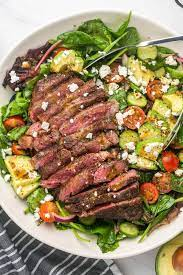

In [ ]:
from google.colab import files
from PIL import Image
import io

# Upload the image file from your local machine to the Colab environment
uploaded = files.upload()

# Get the uploaded file name
file_name = next(iter(uploaded))

# Open the image using PIL (Python Imaging Library)
img = Image.open(io.BytesIO(uploaded[file_name]))

# Display the image
img.show()
img

In [ ]:
transform = transforms.Compose([transforms.Resize(size = (224,224)),
                               transforms.ToTensor()])
img_tensor = transform(img)
img_list = list(img_tensor)

In [ ]:
custom_image_transformed = img_tensor

In [ ]:
model = model_bagged.to(device)

In [ ]:
model.eval()
with torch.inference_mode():
    # Add an extra dimension to image
    custom_image_transformed_with_batch_size = custom_image_transformed.unsqueeze(dim=0)

    # Print out different shapes
    print(f"Custom image transformed shape: {custom_image_transformed.shape}")
    print(f"Unsqueezed custom image shape: {custom_image_transformed_with_batch_size.shape}")

    # Make a prediction on image with an extra dimension
    custom_image_pred = model(custom_image_transformed.unsqueeze(dim=0
                                                                               ).to(device))
custom_image_pred.shape

Custom image transformed shape: torch.Size([3, 224, 224])
Unsqueezed custom image shape: torch.Size([1, 3, 224, 224])


torch.Size([1, 1000])

In [ ]:
custom_image_pred_probs = [custom_image_pred[0][0].cpu(), custom_image_pred[0][1].cpu(), custom_image_pred[0][2].cpu()]
prediction = torch.argmax(custom_image_pred)
prediction_class = class_names[prediction]
print(f"probabilities: {custom_image_pred_probs}")
print(f"prediction: {prediction}")
print(f"prediction class: {prediction_class}" )


probabilities: [tensor(8.6397), tensor(8.4500), tensor(-1.2885)]
prediction: 0
prediction class: pizza


In [ ]:
# Get all test data paths
from pathlib import Path
test_data_paths = list(Path(test_dir_20_percent).glob('*/*.jpg'))
test_labels = [path.parent.stem for path in test_data_paths]

# Create a function to return a list of dictionaries
def pred_and_store(test_paths, model, transform, class_names):
  test_pred_list = []
  for path in test_paths:
     pred_dict = {}

     #get sample path
     pred_dict["image_path"] = path

     #get class name
     class_name = path.parent.stem
     pred_dict["class_name"] = class_name

     #get prediction
     from PIL import Image
     img = Image.open(path)
     transformed_image = transform(img).unsqueeze(0) # transform image and add batch dimension
     model.eval()
     with torch.inference_mode():
      pred_logit = model(transformed_image)
      pred_prob = torch.softmax(pred_logit, dim = 1)
      pred_label = torch.argmax(pred_prob, dim = 1)
      pred_class = class_names[pred_label]

      pred_dict["pred_prob"] = pred_prob.unsqueeze(0).max()
      pred_dict["pred_class"] = pred_class


     # does the pred label match the true label
     pred_dict["correct"] = class_name == pred_class

     # Add the dictionary to the list of preds
     test_pred_list.append(pred_dict)

  return test_pred_list

transform = transforms.Compose([transforms.ToTensor()])

test_pred_list = pred_and_store(test_data_paths,
                                model.cpu(),
                                transform,
                                class_names)

In [ ]:
# turn test pred dict into a dataframe
import pandas as pd
test_pred_df = pd.DataFrame(test_pred_list)
#sort the dataframe
top_5_most_wrong = test_pred_df.sort_values(by = ["correct", "pred_prob"], ascending = [ True, False]).head(20)

In [ ]:
#Plot the top 5 most wrong images
most_wrong_image_paths = top_5_most_wrong.image_path.tolist()
most_wrong_image_paths

[PosixPath('Data/pizza_steak_sushi_20_percent/test/pizza/998005.jpg'),
 PosixPath('Data/pizza_steak_sushi_20_percent/test/pizza/3375083.jpg'),
 PosixPath('Data/pizza_steak_sushi_20_percent/test/steak/3757027.jpg'),
 PosixPath('Data/pizza_steak_sushi_20_percent/test/pizza/419962.jpg'),
 PosixPath('Data/pizza_steak_sushi_20_percent/test/pizza/833711.jpg'),
 PosixPath('Data/pizza_steak_sushi_20_percent/test/sushi/705150.jpg'),
 PosixPath('Data/pizza_steak_sushi_20_percent/test/pizza/3376617.jpg'),
 PosixPath('Data/pizza_steak_sushi_20_percent/test/pizza/476421.jpg'),
 PosixPath('Data/pizza_steak_sushi_20_percent/test/pizza/1555015.jpg'),
 PosixPath('Data/pizza_steak_sushi_20_percent/test/pizza/1032754.jpg'),
 PosixPath('Data/pizza_steak_sushi_20_percent/test/steak/1285886.jpg'),
 PosixPath('Data/pizza_steak_sushi_20_percent/test/sushi/1383396.jpg'),
 PosixPath('Data/pizza_steak_sushi_20_percent/test/pizza/61656.jpg'),
 PosixPath('Data/pizza_steak_sushi_20_percent/test/pizza/129666.jpg'),


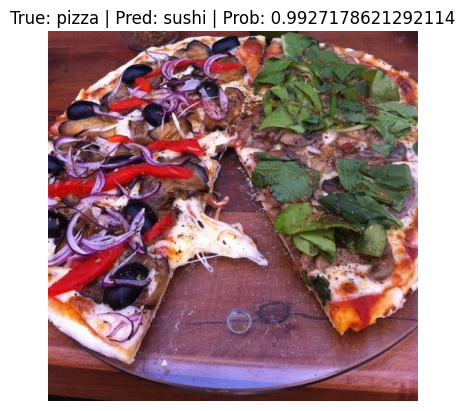

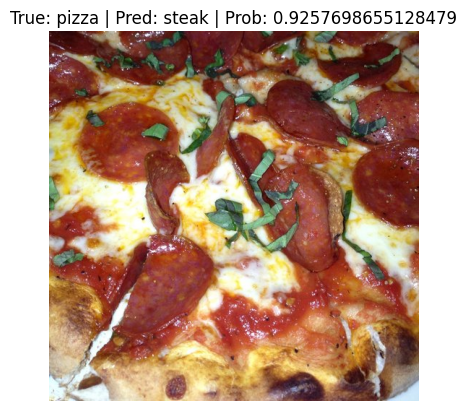

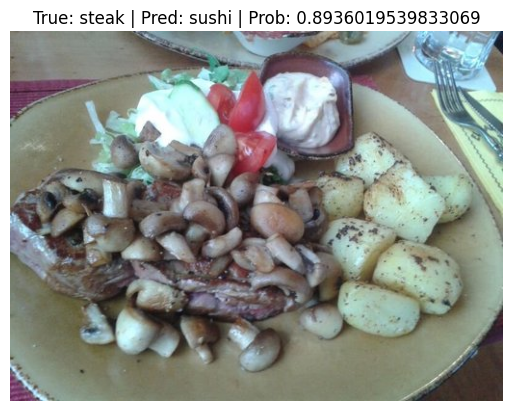

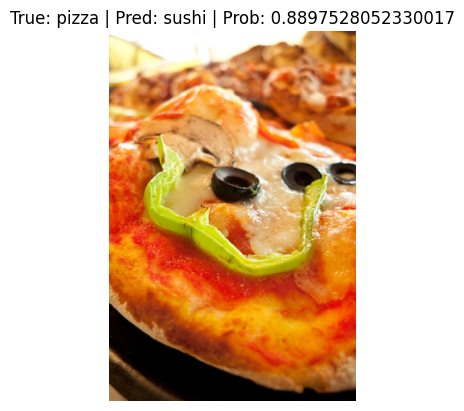

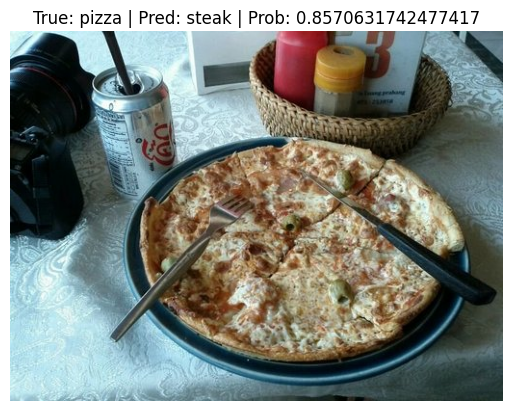

...

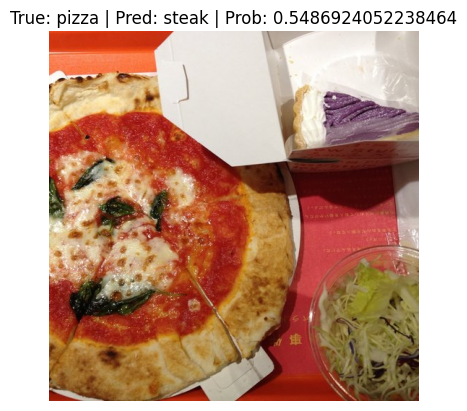

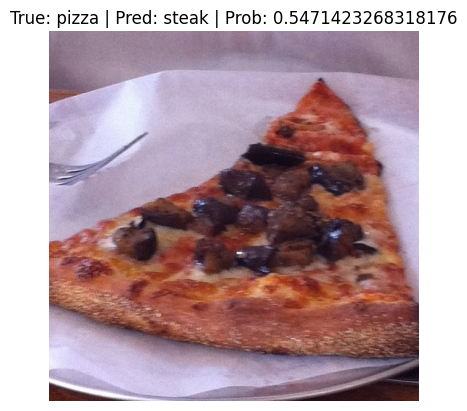

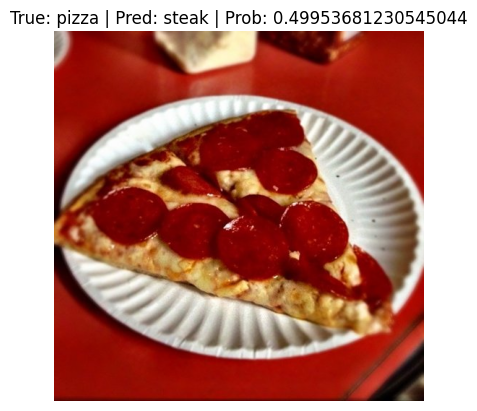

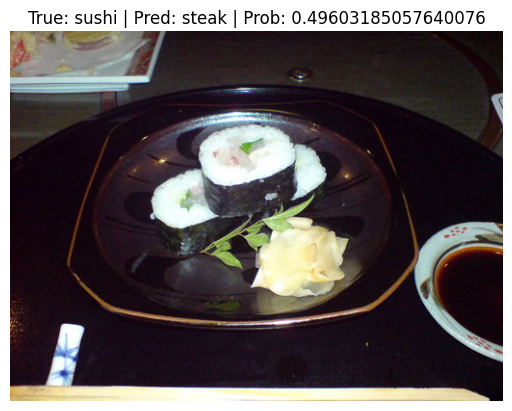

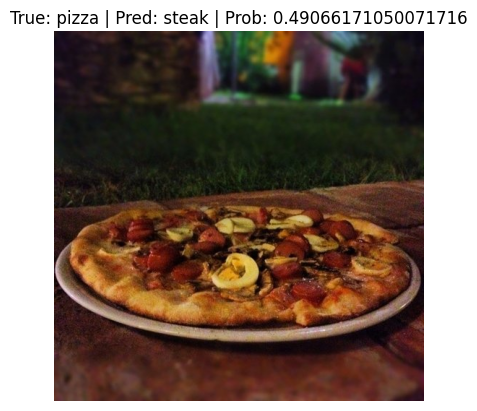

In [ ]:
import torchvision
for row in top_5_most_wrong.iterrows():
  row = row[1]


  image_path = row[0]
  true_label = row[1]
  pred_prob = row[2]
  pred_class = row[3]

  #plot the images
  img = torchvision.io.read_image(str(image_path))
  plt.figure()
  plt.imshow(img.permute(1,2,0))
  plt.title(f"True: {true_label} | Pred: {pred_class} | Prob: {pred_prob}")
  plt.axis(False)

#### 10. Getting more data for validation and potentially further training.

Lets learn how to make labelled datasets from google images. (Bing..)

In [ ]:
!pip install bing-image-downloader

In [ ]:
!mkdir validation images

maybe it's the timeout which is capping the number of images downloaded.

In [ ]:
from bing_image_downloader import downloader
downloader.download("pizza",
                    limit = 100,
                    output_dir = 'validation images',
                    timeout = 120)

[%] Downloading Images to /content/validation images/pizza


[!!]Indexing page: 1

[%] Indexed 35 Images on Page 1.


[%] Downloading Image #1 from http://thelistlove.com/wp-content/uploads/2014/12/dominos-pepperoni-pizza.jpg
[%] File Downloaded !

[%] Downloading Image #2 from https://assets.teenvogue.com/photos/5ab665d06d36ed4396878433/master/pass/GettyImages-519526540.jpg
[%] File Downloaded !

[%] Downloading Image #3 from https://media.timeout.com/images/103437036/image.jpg
[%] File Downloaded !

[%] Downloading Image #4 from https://i1.wp.com/aestheticbeats.com/wp-content/uploads/2020/02/Cheese-Pizza-scaled.jpg?fit=2048%2C1862&amp;ssl=1
[%] File Downloaded !

[%] Downloading Image #5 from https://images4.alphacoders.com/644/644372.jpg
[%] File Downloaded !

[%] Downloading Image #6 from https://riotfest.org/wp-content/uploads/2016/10/img_2124.jpg
[%] File Downloaded !

[%] Downloading Image #7 from https://www.syracuse.com/resizer/KKUQY0k2wtljJ0yzpfGZ2Cq4Hdc=/1280x0/smart/advance

In [ ]:
downloader.download("neopolitan pizza", limit = 1500, output_dir = 'validation images' )

[%] Downloading Images to /content/validation images/neopolitan pizza


[!!]Indexing page: 1

[%] Indexed 35 Images on Page 1.


[%] Downloading Image #1 from https://stellaculinary.com/sites/default/files/neapolitan-pizza-dough.jpg
[%] File Downloaded !

[%] Downloading Image #2 from http://vitaitaliantours.com/wp-content/uploads/2016/03/Neapolitan-Pizza-Margherita.jpg
[%] File Downloaded !

[%] Downloading Image #3 from https://fthmb.tqn.com/ct7-FEFmg3DlUAVJL-IIIoBDk0Y=/3456x2304/filters:fill(auto,1)/authentic-neapolitan-margherita-pizza-157507884-582612543df78c6f6acb5a8a.jpg
[%] File Downloaded !

[%] Downloading Image #4 from http://nogluten-noproblem.com/wp-content/uploads/2020/03/P1110869-1920x1920.jpg
[!] Issue getting: http://nogluten-noproblem.com/wp-content/uploads/2020/03/P1110869-1920x1920.jpg
[!] Error:: HTTP Error 308: Permanent Redirect
[%] Downloading Image #4 from https://www.dcfud.com/wp-content/uploads/2019/07/neo.jpg
[%] File Downloaded !

[%] Downloading Image #5 f

In [ ]:
downloader.download("takeaway pizza", limit = 1500, output_dir = 'validation images' )

In [ ]:
downloader.download("steak", limit = 1500, output_dir = 'validation images' )

[%] Downloading Images to /content/validation images/steak


[!!]Indexing page: 1

[%] Indexed 35 Images on Page 1.


[%] Downloading Image #1 from https://www.cookingclassy.com/wp-content/uploads/2019/07/steak-marinade-12.jpg
[%] File Downloaded !

[%] Downloading Image #2 from https://www.nutritionadvance.com/wp-content/uploads/2018/11/how-to-cook-steak.jpg
[%] File Downloaded !

[%] Downloading Image #3 from https://media1.s-nbcnews.com/i/newscms/2018_07/1318715/grilled-steak-today-tease-180216_89508b219dd455b4d43311782841f938.jpg
[%] File Downloaded !

[%] Downloading Image #4 from http://images6.fanpop.com/image/photos/34400000/Steak-meat-34450442-1302-1020.jpg
[%] File Downloaded !

[%] Downloading Image #5 from https://i.pinimg.com/originals/26/27/0b/26270bf5917707ef8030b7ddc1c53405.jpg
[%] File Downloaded !

[%] Downloading Image #6 from http://www.steakboyz.com/uploads/1/2/0/9/12092477/shutterstock-465836414_orig.jpg
[%] File Downloaded !

[%] Downloading Image #7 from https:/

In [ ]:
downloader.download("sushi", limit = 1500, output_dir = 'validation images')

[%] Downloading Images to /content/validation images/sushi


[!!]Indexing page: 1

[%] Indexed 35 Images on Page 1.


[%] Downloading Image #1 from https://tripsavvy.com/thmb/LJLRfoSPI_56ihVGr15EBH18yFk%3D/5096x3418/filters:fill(auto%2C1)/GettyImages-126553802-56a541cb3df78cf772875a68.jpg
[%] File Downloaded !

[%] Downloading Image #2 from https://www.thespruceeats.com/thmb/IzejeJObvz4lvYpW06uwhX6iR00=/3680x2456/filters:fill(auto,1)/GettyImages-Ridofranz-1053855542-60b89644efd2470fbfb6475b175064df.jpg
[%] File Downloaded !

[%] Downloading Image #3 from http://www.readersdigest.ca/wp-content/uploads/2011/11/japanese-sushi-rolls.jpg
[%] File Downloaded !

[%] Downloading Image #4 from https://upload.wikimedia.org/wikipedia/commons/6/60/Sushi_platter.jpg
[%] File Downloaded !

[%] Downloading Image #5 from https://www.wallpaperup.com/uploads/wallpapers/2015/06/14/722372/7f97f3f2d2426b9809438a32fb9521be.jpg
[%] File Downloaded !

[%] Downloading Image #6 from https://facts.net/wp-content

#### 10.2 Selecet the image path
we have our images, we now need to open them in google colab and assign labels in the same format as previously done.

In [ ]:
#print(test_dataset)

this will require us to open them as an image, perform the transforms and then add the label manually

In [ ]:
#### Getting the 20% code
import os
import requests
import zipfile

from pathlib import Path

# Setup path to data folder
validation_data_path = Path("validation images")

# Setup Dirs
pizza_val_dir = validation_data_path / "pizza"
steak_val_dir = validation_data_path / "steak"
sushi_val_dir = validation_data_path / "sushi"


#### 10.4 Open the images

In [ ]:
import os
from PIL import Image
import numpy as np

def open_images(target_dir):
    # Get a list of image file names in the directory
    image_files = [f for f in os.listdir(target_dir) if os.path.isfile(os.path.join(target_dir, f))]

    # Load images using Pillow
    images = [Image.open(os.path.join(target_dir, f)) for f in image_files]

    return images

X_pizza = open_images(pizza_val_dir)
X_steak = open_images(steak_val_dir)
X_sushi = open_images(sushi_val_dir)

10.5 Format and label the images

---



---



In [ ]:
def format_images(data, label, transform):

  """Takes in bing image data, turns to tensor, permutes, changes dtype to float 32 and adds label"""

  data_formatted = []


  for n in range(len(data)):

        data_arr = np.asarray(data[n])

        #debugging
        #print(n)

        #skip greyscale images
        if len(data_arr.shape) == 2:

          #debugging
          print(n)

          continue

        #reduce a dimension of 3rd channel to 3 if higher
        if data_arr.shape[2] > 3:
          data_dimension_reduced = data_arr[:, :, :3]

          #debugging
          print(n)

          data[n] = data_dimension_reduced

        # Convert to PIL Image if necessary
        if isinstance(data[n], np.ndarray):

          #debugging
          #print(n)

          data[n] = Image.fromarray(data[n])

        #transform the data
        data_transform = transform(data[n])

        #add the label
        data_format = (data_transform, label)

        #append to a pizza file
        data_formatted.append(data_format)

  return data_formatted





#

##### 10.5.1 Come up with the if statements so we can format each image

we are getting some errors it seems not all the data is the same. output errors:
- [1, 224, 224] not [3, 224, 224]:
fix by adding in an if statement if output channel = 1 then make = 3

- The size of tensor a (4) must match the size of tensor b (3) at non-singleton dimension 0:
add an if statement to unsqueeze or squeeze tensors depending on their dimensions


In [ ]:
import torch
from torchvision import transforms

mean , std =  [0.485,0.456,0.406] , [0.229,0.224,0.225]

transform = transforms.Compose([
                                    transforms.Resize(size= (224,224)),
                                    transforms.ToTensor(),
                                    transforms.Normalize(mean, std)
                               ])

In [ ]:
pizza_data = format_images(data = X_pizza,
                           label = 0,
                           transform = transform)
steak_data = format_images(data = X_steak,
                           label = 1,
                           transform = transform)
sushi_data = format_images(data = X_sushi,
                           label = 2,
                           transform = transform)

each individual tensor is formatted correctly but i'm not sure if this will work as we havent opened with image folder, it should work for our make predictions function but we might run into trouble when training.

#### 10.6 Create a combined validation data set

In [ ]:
validation_data = []

validation_data.extend(pizza_data)
validation_data.extend(steak_data)
validation_data.extend(sushi_data)

len(validation_data)

147

#### 10.7 Making predictions with loaded bagged_models_augmented_2

In [ ]:
pred_probs, pred_logits, labels = make_predictions(model = ensemble_model_loaded,
                                                   data = validation_data,
                                                   device = 'cpu')

In [ ]:
predictions = torch.argmax(pred_probs, dim = 1)
predictions_tensor = predictions.cpu() == torch.tensor(labels)
predictions_tensor

tensor([ True,  True, False,  True,  True,  True,  True,  True,  True, False,
         True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True, False,  True,  True, False,  True,  True,
         True, False,  True,  True,  True,  True,  True,  True,  True,  True,
        False,  True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True, False,  True,  True,  True, False,  True,  True,  True,
         True,  True, False,  True, False,  True,  True,  True, False,  True,
         True,  True,  True, False,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True, False,
         True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True, 

In [ ]:
# Compare predictions with ground truth labels
correct_predictions = (predictions_tensor)

# Calculate the accuracy by taking the mean of the correct predictions
accuracy = correct_predictions.sum().item()/len(predictions) * 100.0

print(f"Accuracy: {accuracy:.2f}%")

Accuracy: 92.47%


#### 10.8 Results
91 % accurcay achieved using our best bagged model which used data augmentation, on the first set of data we have looked at from bing (101 data points). This is not bad however would have expected it to be slightly higher due to the test data prediction being 97.25%

92.47% on second run with 186 data points, probably contains same data as first run plus some, increase in overall accuracy is seen. around 94% plus accuracy on extra data if all data points from first run are still included.  

#### 10.9 Lets look at where the model was going wrong

In [ ]:
wrong_predictions = []

for n in range(len(predictions_tensor)):

  if predictions_tensor[n] == False:

    wrong_predictions.append(n)

wrong_predictions

[58, 85]

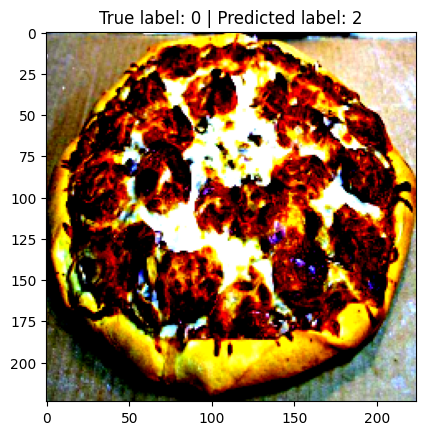

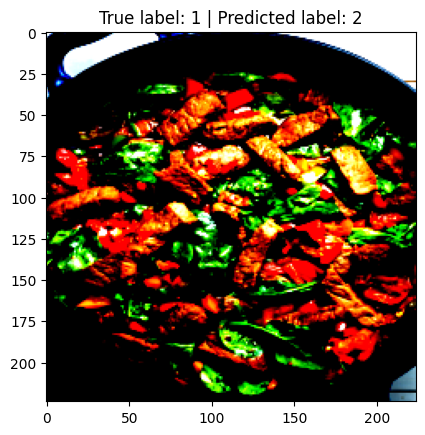

In [ ]:
for index in wrong_predictions:
    image_tensor, label = validation_data[index]

    plt.imshow(image_tensor.permute(1,2,0))
    plt.title(f"True label: {label} | Predicted label: {predictions[index]}")
    plt.show()


#### 10.10 Attempt 1

Some of the images are hard to predict such as the stake bowl and steak stir fry.

the three pizzas at the top I would have hoped the models could predict them.

the three steaks at the bottom are quite obviously steak however the formate of the images may have thrownw the model off slightly

#### Direction to go from here...

- see with how other saved models perform on the validation data

- boosting our models

- look up feature selection techniques and impliment them into the models

- outlier detection - remove outliers in the dataset from the model

- start on some unsupervised learning

#### we also have now a very strong framework for testing

- let's mess around with it for a bit and see what accuracys we can achieve. top on test 98.67% (unable to predict on 2 images)

#### 11. Feature selection

Common image features:

- pixel level statistics, grayscale and colour channelled histograms giving pixel intensity. divide histograms into bins and take area to get a feature. describe statistics of the histogram i.e mean intensity, intensity varience etc. in colour images we have bin values in a cube for RBG. typically take different brightnesss of the same hu as the same colour, RGB
- texture based info i.e stripes on a zebra, self repeating patterns. use fourier descriptors, or GLCM methods
- Hu invariant moment - extracts features that capture the shape that are invarient over translation

feature selection in the context of transfer learning:

- Transfer Learning Framework: In some transfer learning scenarios, especially when using deep learning models like pre-trained neural networks (e.g., models trained on ImageNet for computer vision tasks), the model itself acts as a feature extractor. The lower layers of the model often capture general features that can be useful for various tasks. In such cases, explicit feature selection might not be necessary, as the model learns to focus on relevant features during fine-tuning.


